=========================================================================

  Notebook Author:  Meir M.  

  Subject: Human Activity Recognition by Smartphone & Smartwatch
  
  Date:    May 2020

  Course:  Data Scince.

  
  Submitted as the final Project in the Classification part of the course.

  =========================================================================

  Disclaimer:

  This software was designed to be used only for private learning purposes.

  Any use or copying of this software or part of it, is not allowed

  This software comes with no warranties of any kind whatsoever

  =========================================================================

 
---



---



---
# **Human Activity Recognition by Smartphone & Smartwatch Kinematic Sensors**


---


---

---



Data set source:  WISDM Lab of Frodham University, NY

available from the UCI Machine Learning Repository

https://archive.ics.uci.edu/ml/datasets/WISDM+Smartphone+and+Smartwatch+Activity+and+Biometrics+Dataset+

For the source files of the dataset and additional background - see there.

**REMARK:**
 Some apparent errors have been detected in these source files of the dataset:

The following feature columns are suspected to contain erronreous values:

'XSTANDDEV', 'YSTANDDEV', 'ZSTANDDEV', 'XVAR', 'YVAR', 'ZVAR'

The following files:

data_1611_accel_phone.arff - data_1617_accel_phone.arff

are all identical replicates on the file: data_1610_accel_phone.arff

---



### **Background on data collection method:**


---



Two kinds of devices:

1)Smartphone (Samsung Galaxy S5)

2)Smartwatch (LG G)

Two kinds of embedded kinematic sensors (for each device):

1) Accelerometer - for measurement of linear acceleration (m/sec^2)

**Remark:**

 It seems that the accelerometer doesn't, actually, measure the acceleration but rather the *force* exerted on it, calibrated per the mass of the device.
Hence, also while being in equilibrium state, (i.e. zero acceleration), the accelerometer outputs a vertical acceleration of 9.8 m/s^2, uowards.

2) Gyroscope - for measurement of angular velocity (rad/sec)



51 Participants

18 Physical Activities of daily living

*   Non hand oriented activities (leg):--->
{walking,
jogging, stairs, standing, kicking}
*   hand oriented activities:--->
{dribbling, playing catch, typing, writing, clapping,
brushing teeth, folding clothes}
*   Hand
oriented activities (eating):--->
{eating
pasta, eating soup, eating sandwich, eating
chips, drinking}

Each activity has been performed for 3 minutes

sensors sampling rate: 20 Hz (i.e. every 50 ms) - Only approximately - subject to OS constraints.

Number of raw measurements:  15,630,426

Device placement:

smartphone - placed in the participant's front right
pants leg pocket

smartwatch - wrapped on dominant hand

**Transformed, labeled, datasets:**


---


A sliding window approach is used to transform the time series data into a derived dataset of respective characterized, labeled data records, each of which describing a single time window data - window duration 10 sec (non overlapping)

Number of labled 10 sec window processed data records: 78,152 (51 x 3 x 60 x 20)

### Reference coordinate system definition:
---

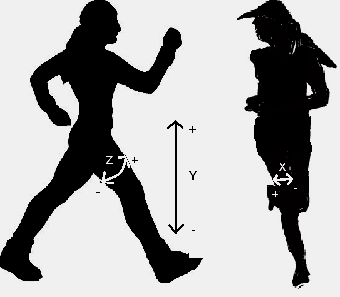

**Devices measurements reference axes (inferred from the raw data):**

---



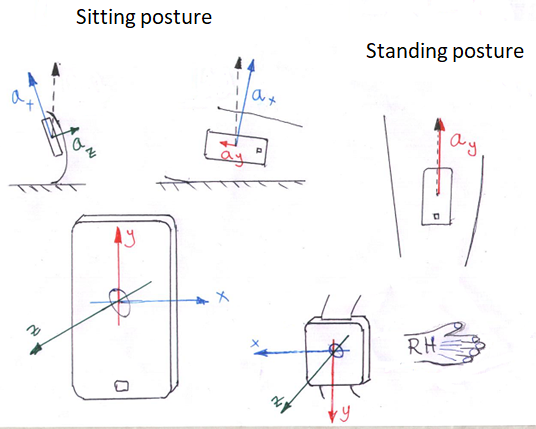



---



---



---


# **REMARK:** This notebook is dedicated to analyzing only the **Phone-Acceleration** measurement Dataset (hence, it's suffix "PA")

This notebook can be replicated to relate to the other measurement channels: Phone-Gyro, Watch-Acceleration, Watch-Gyro


---



---



---



---
# **Exploratory Data Analysis of raw data (time series sensors data)**
---

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

In [0]:
activity_codes_mapping = {'A': 'walking',
                          'B': 'jogging',
                          'C': 'stairs',
                          'D': 'sitting',
                          'E': 'standing',
                          'F': 'typing',
                          'G': 'brushing teeth',
                          'H': 'eating soup',
                          'I': 'eating chips',
                          'J': 'eating pasta',
                          'K': 'drinking from cup',
                          'L': 'eating sandwich',
                          'M': 'kicking soccer ball',
                          'O': 'playing catch tennis ball',
                          'P': 'dribbling basket ball',
                          'Q': 'writing',
                          'R': 'clapping',
                          'S': 'folding clothes'}

activity_color_map = {activity_codes_mapping['A']: 'lime',
                      activity_codes_mapping['B']: 'red',
                      activity_codes_mapping['C']: 'blue',
                      activity_codes_mapping['D']: 'orange',
                      activity_codes_mapping['E']: 'yellow',
                      activity_codes_mapping['F']: 'lightgreen',
                      activity_codes_mapping['G']: 'greenyellow',
                      activity_codes_mapping['H']: 'magenta',
                      activity_codes_mapping['I']: 'gold',
                      activity_codes_mapping['J']: 'cyan',
                      activity_codes_mapping['K']: 'purple',
                      activity_codes_mapping['L']: 'lightgreen',
                      activity_codes_mapping['M']: 'violet',
                      activity_codes_mapping['O']: 'limegreen',
                      activity_codes_mapping['P']: 'deepskyblue',   
                      activity_codes_mapping['Q']: 'mediumspringgreen',
                      activity_codes_mapping['R']: 'plum',
                      activity_codes_mapping['S']: 'olive'}
#                     activity_codes_mapping['A']: 'rgb(231, 41, 138)',
                          



---


# **Exploration of raw data files:**


---



Raw data vizualization helper functions definition:

In [0]:
def show_accel_per_activity(device, df, act, interval_in_sec = None):
  ''' Plots acceleration time history per activity '''

  df1 = df.loc[df.activity == act].copy()
  df1.reset_index(drop = True, inplace = True)

  df1['duration'] = (df1['timestamp'] - df1['timestamp'].iloc[0])/1000000000 # nanoseconds --> seconds

  if interval_in_sec == None:
    ax = df1[:].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)
  else:
    ax = df1[:interval_in_sec*20].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)

  ax.set_xlabel('duration  (sec)', fontsize = 15)
  ax.set_ylabel('acceleration  (m/sec^2)',fontsize = 15)
  ax.set_title('Acceleration:   Device: ' + device + '      Activity:  ' + act, fontsize = 15)

#  ax.set(xlabel='xlabel', ylabel='ylabel', title='Video streaming dropout by category')

In [0]:
def show_ang_velocity_per_activity(device, df, act, interval_in_sec = None):
  ''' Plots angular volocity time history per activity '''

  df1 = df.loc[df.activity == act].copy()
  df1.reset_index(drop = True, inplace = True)

  df1['duration'] = (df1['timestamp'] - df1['timestamp'].iloc[0])/1000000000 # nanoseconds --> seconds

  if interval_in_sec == None:
    ax = df1[:].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)
  else:
    ax = df1[:interval_in_sec*20].plot(kind='line', x='duration', y=['x','y','z'], figsize=(25,7), grid = True) # ,title = act)

  ax.set_xlabel('duration  (sec)', fontsize = 15)
  ax.set_ylabel('angular velocity  (rad/sec)',fontsize = 15)
  ax.set_title('Angular velocity:  Device: ' + device + '      Activity:  ' + act, fontsize = 15)

#  ax.set(xlabel='xlabel', ylabel='ylabel', title='Video streaming dropout by category')



---


## **Visualization of the time-series raw data for individual participants:**


---



## **1) Phone - Acceleration** measurement data:

**EDA Typical example: Participant no. 10 - Smartphone - Accelerometer reading history**

In [0]:
raw_par_10_phone_accel = pd.read_csv(r'/content/drive/My Drive/WISDM/raw/phone/accel/data_1610_accel_phone.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_10_phone_accel.z = raw_par_10_phone_accel.z.str.strip(';')
raw_par_10_phone_accel.z = pd.to_numeric(raw_par_10_phone_accel.z)

raw_par_10_phone_accel['activity'] = raw_par_10_phone_accel['activity_code'].map(activity_codes_mapping)

raw_par_10_phone_accel = raw_par_10_phone_accel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_10_phone_accel


,participant_id,activity_code,activity,timestamp,x,y,z
0,1610,A,walking,18687441561967,1.174957,13.347473,-4.034637
1,1610,A,walking,18687491915971,1.408188,7.091858,-3.895721
2,1610,A,walking,18687542269974,4.932510,6.306808,-2.339004
3,1610,A,walking,18687592623978,0.154648,6.123505,-1.831467
4,1610,A,walking,18687642977982,-2.826035,4.180542,-3.211899
...,...,...,...,...,...,...,...
80865,1610,S,folding clothes,17989031516129,5.946732,7.583008,-1.097259
80866,1610,S,folding clothes,17989081870133,5.818741,7.804871,-1.623733
80867,1610,S,folding clothes,17989132224137,5.530823,7.636093,-1.662643
80868,1610,S,folding clothes,17989182578141,5.802170,7.645752,-1.000412


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb5d3559128>,
      dtype=object)

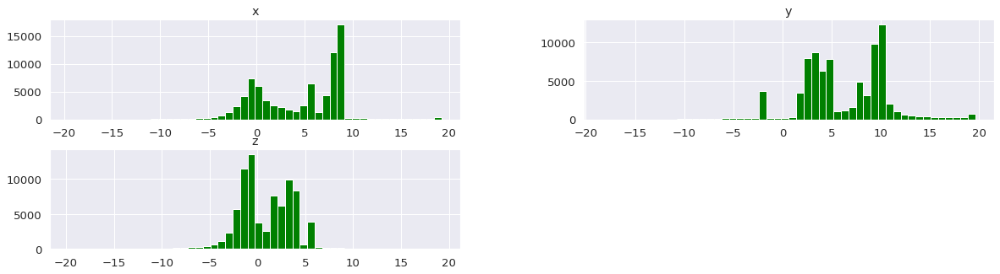

In [0]:
#T = raw_par_10_phone_accel.iloc[:200]
T = raw_par_10_phone_accel
T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')
#T.hist(column='x', by='activity')

**Observation: largely bimodal nature corresponds to standing - sitting related typical posture separation !**

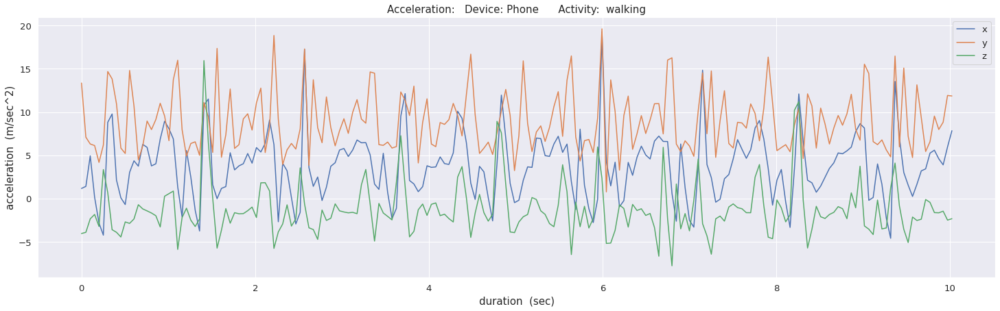

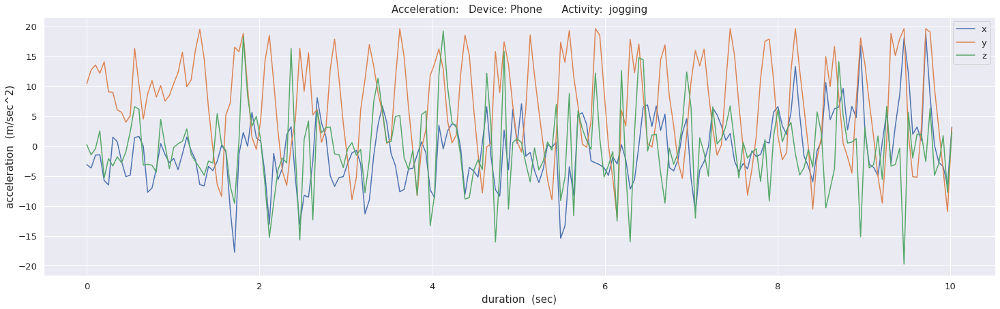

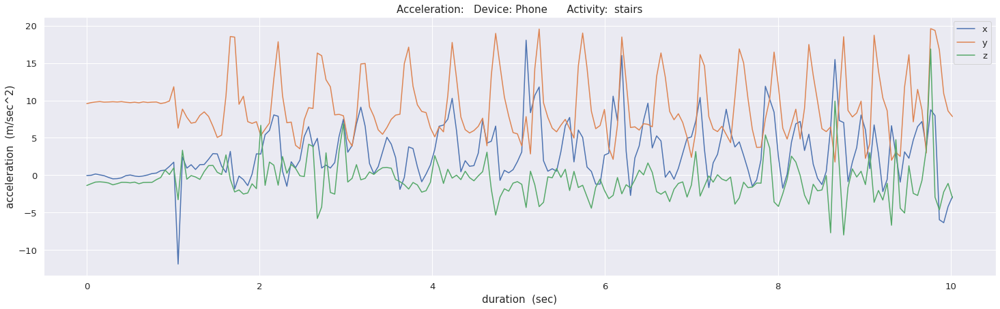

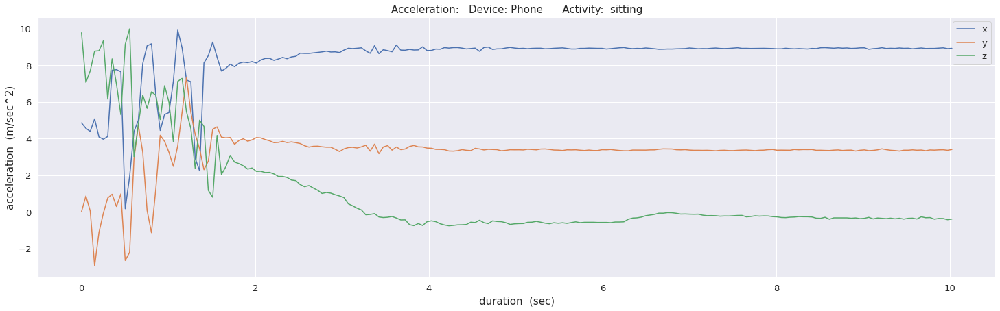

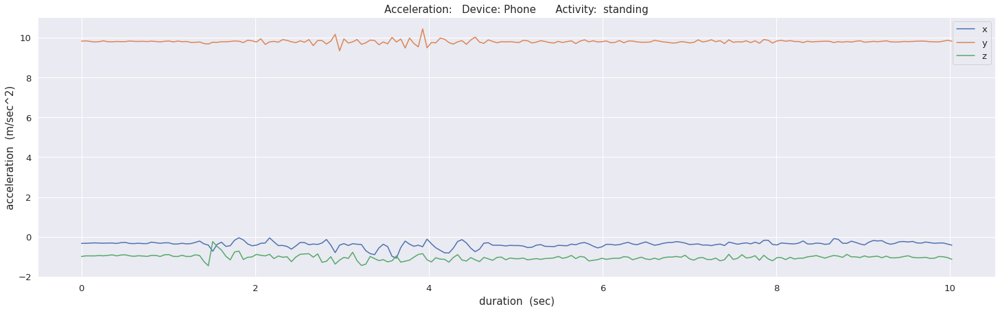

...

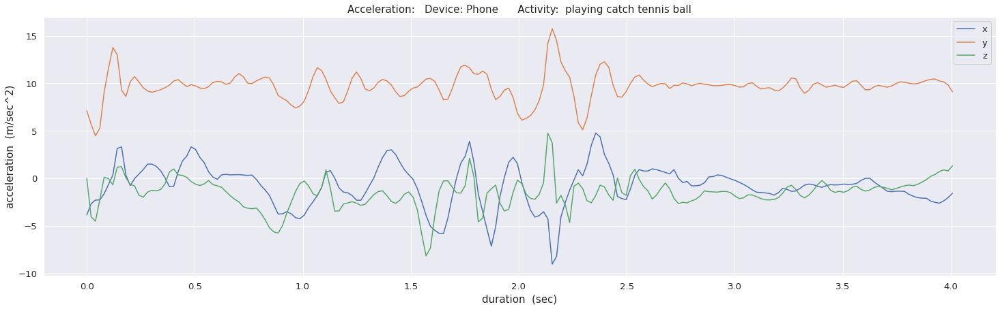

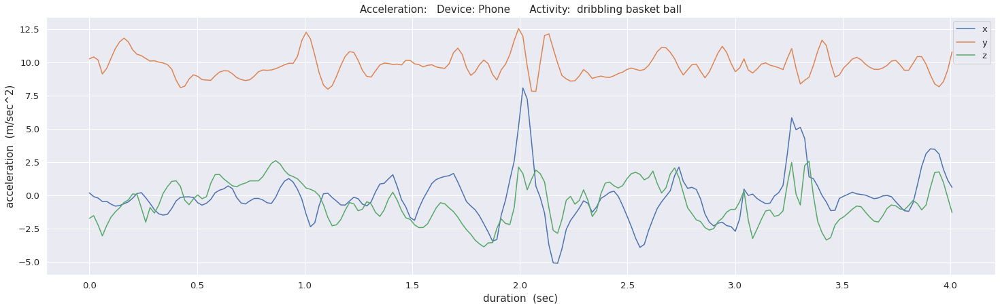

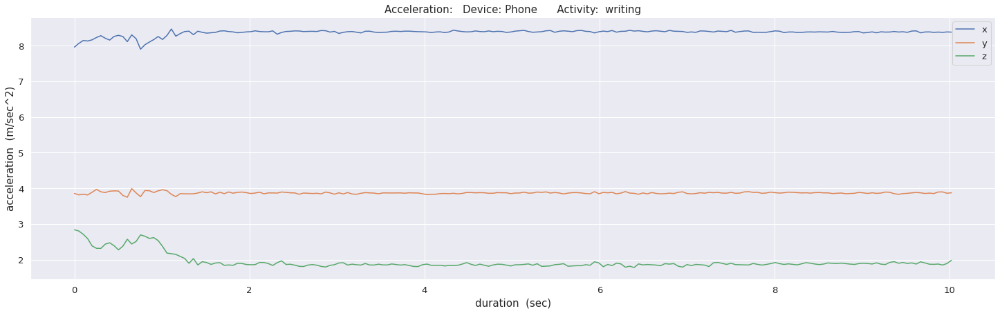

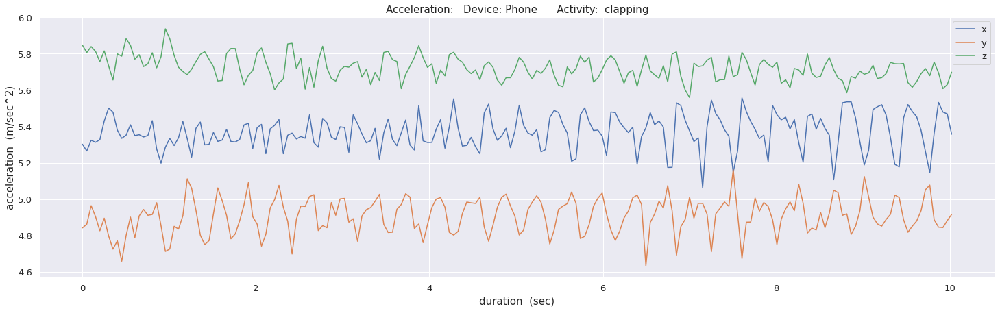

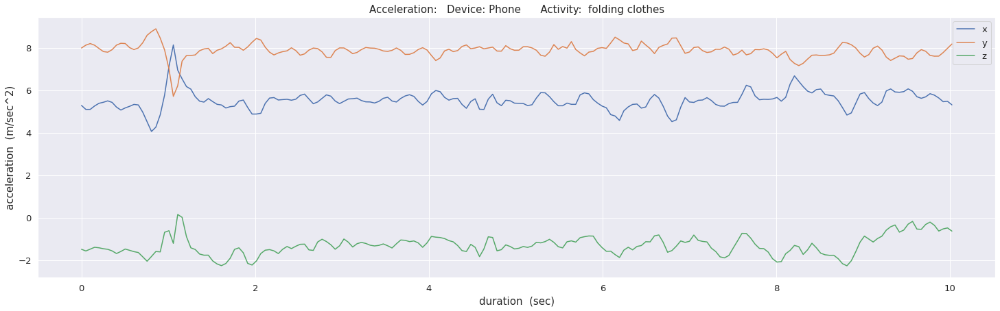

In [0]:
for key in activity_codes_mapping:
  show_accel_per_activity('Phone', raw_par_10_phone_accel, activity_codes_mapping[key], 10)


## **2) watch - acceleration** measurement data:

**EDA Typical example: Participant no. 20 - Smartwatch - Accelerometer reading history**

In [0]:
raw_par_20_watch_accel = pd.read_csv(r'/content/drive/My Drive/WISDM/raw/watch/accel/data_1620_accel_watch.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_20_watch_accel.z = raw_par_20_watch_accel.z.str.strip(';')
raw_par_20_watch_accel.z = pd.to_numeric(raw_par_20_watch_accel.z)

raw_par_20_watch_accel['activity'] = raw_par_20_watch_accel['activity_code'].map(activity_codes_mapping)

raw_par_20_watch_accel = raw_par_20_watch_accel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_20_watch_accel


,participant_id,activity_code,activity,timestamp,x,y,z
0,1620,A,walking,37945621841814,3.417424,-2.164957,-4.849306
1,1620,A,walking,37945671341814,5.423765,-6.936601,-4.954651
2,1620,A,walking,37945720841814,4.700716,-3.127426,-7.648128
3,1620,A,walking,37945770341814,8.033444,-4.700417,-5.024083
4,1620,A,walking,37945819841814,3.970484,-1.645415,-3.621080
...,...,...,...,...,...,...,...
67189,1620,S,folding clothes,42368439960621,6.524798,-4.589834,0.573262
67190,1620,S,folding clothes,42368489889911,9.100959,-4.168455,-0.602291
67191,1620,S,folding clothes,42368539819201,7.590218,-5.736657,-1.854459
67192,1620,S,folding clothes,42368589748491,8.681973,-6.284929,-5.180005


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb5d487c1d0>,
      dtype=object)

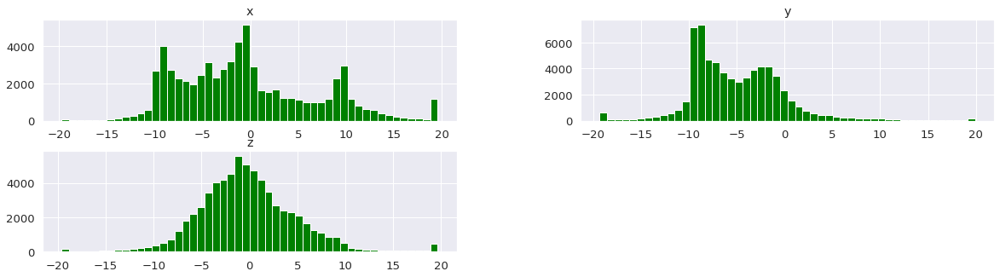

In [0]:
#T = raw_par_20_watch_accel.iloc[:200]
T = raw_par_20_watch_accel
T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

**Observation: modes separations: hand downwards --- hand upwards --- hand horizontal ( two roll positions)**

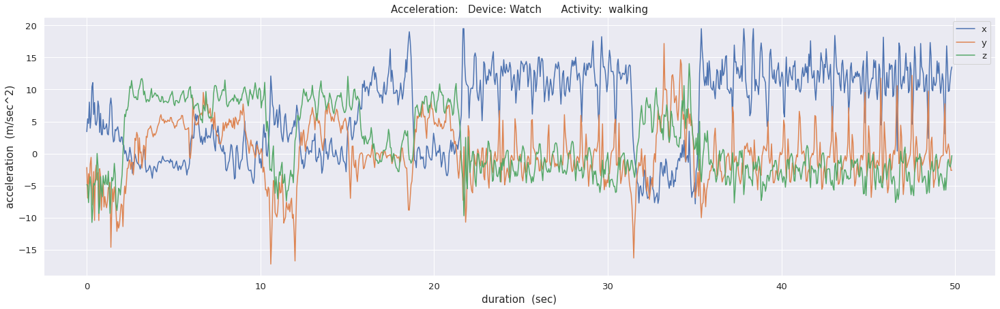

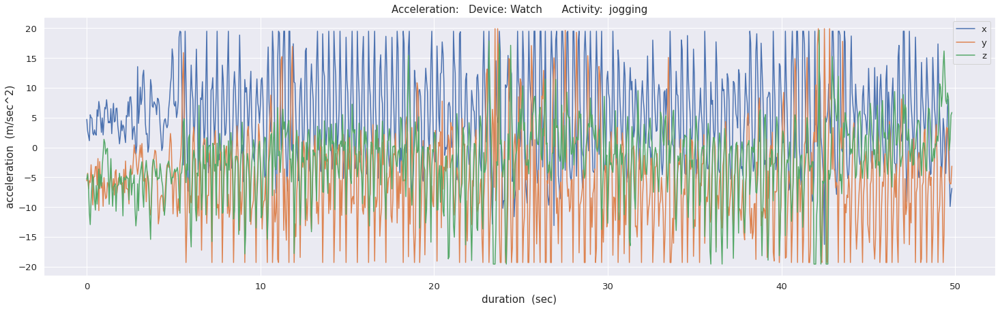

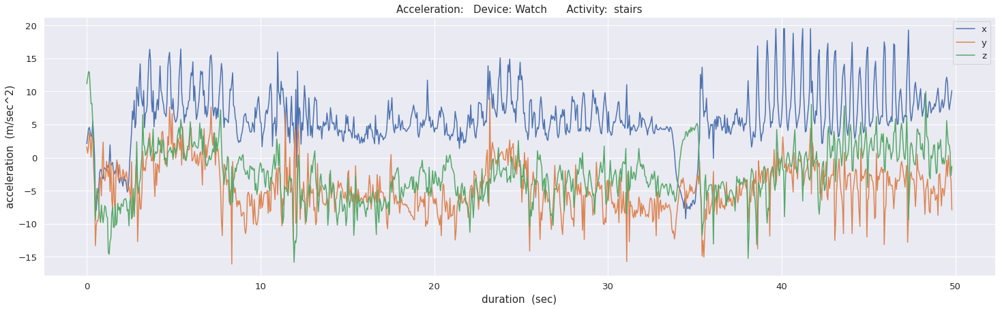

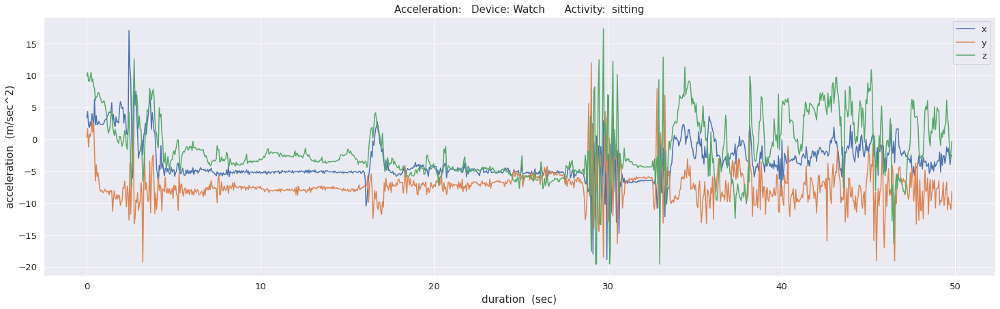

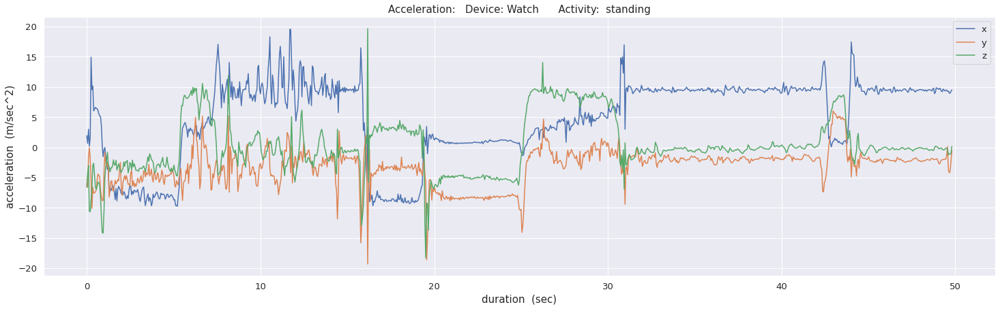

...

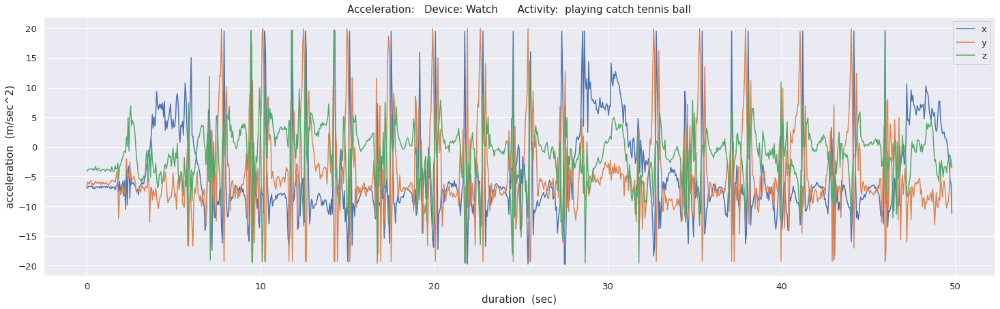

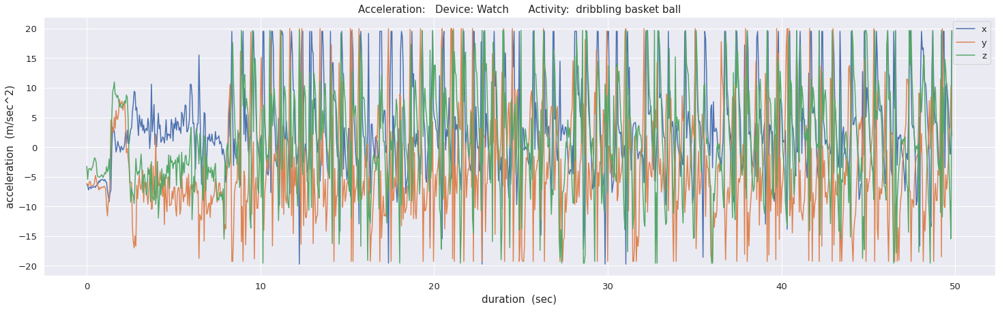

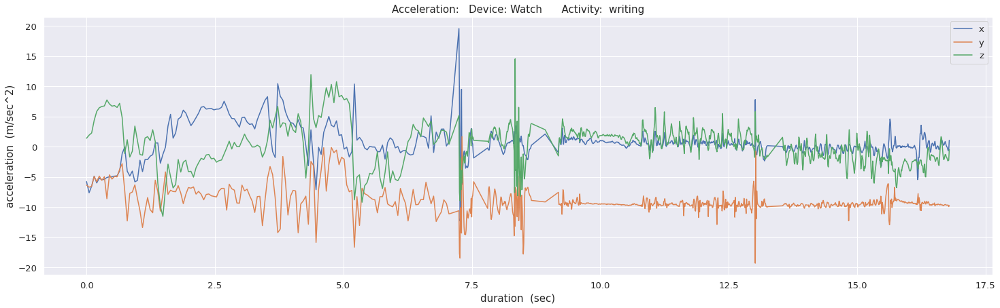

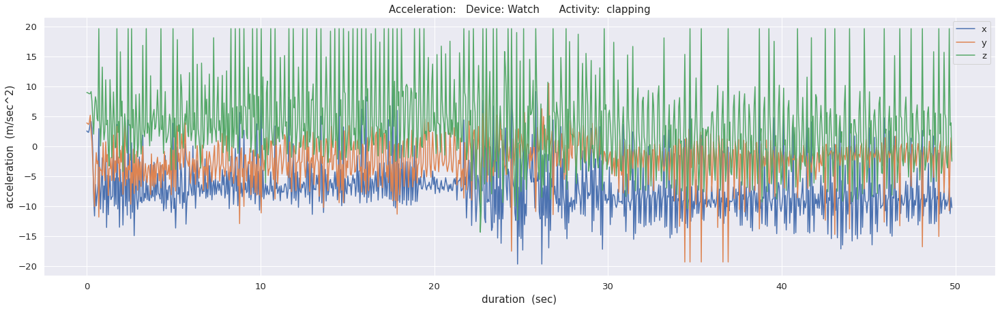

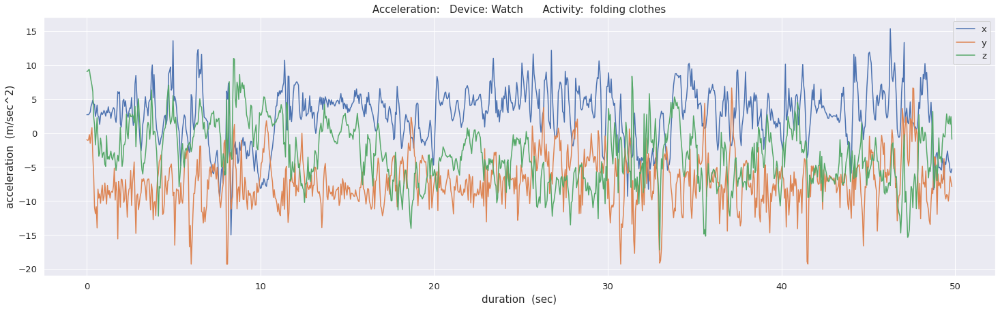

In [0]:
for key in activity_codes_mapping:
  show_accel_per_activity('Watch', raw_par_20_watch_accel, activity_codes_mapping[key], 50)

## **3) phone - angular velocity** measurment data:

**EDA typical example: Participant no. 35 - Smartphone - angular velocity reading history**

In [0]:
raw_par_35_phone_ang_vel = pd.read_csv(r'/content/drive/My Drive/WISDM/raw/phone/gyro/data_1635_gyro_phone.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_35_phone_ang_vel.z = raw_par_35_phone_ang_vel.z.str.strip(';')
raw_par_35_phone_ang_vel.z = pd.to_numeric(raw_par_35_phone_ang_vel.z)

raw_par_35_phone_ang_vel['activity'] = raw_par_35_phone_ang_vel['activity_code'].map(activity_codes_mapping)

raw_par_35_phone_ang_vel = raw_par_35_phone_ang_vel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_35_phone_ang_vel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1635,A,walking,676165107876419,0.874725,-0.098099,0.807510
1,1635,A,walking,676165158230423,0.563431,-1.359665,1.432419
2,1635,A,walking,676165208584427,1.507690,-3.086883,0.679016
3,1635,A,walking,676165258938431,1.430603,-1.860306,0.451035
4,1635,A,walking,676165309292435,0.325165,-1.735611,0.252365
...,...,...,...,...,...,...,...
64530,1635,S,folding clothes,680277872380268,-0.119614,-0.032928,0.129654
64531,1635,S,folding clothes,680277922750286,-0.500427,-0.465652,0.098923
64532,1635,S,folding clothes,680277973104290,-0.768646,-0.448929,0.063583
64533,1635,S,folding clothes,680278023458294,-0.786408,-0.346924,0.099899


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb5ca95b0b8>,
      dtype=object)

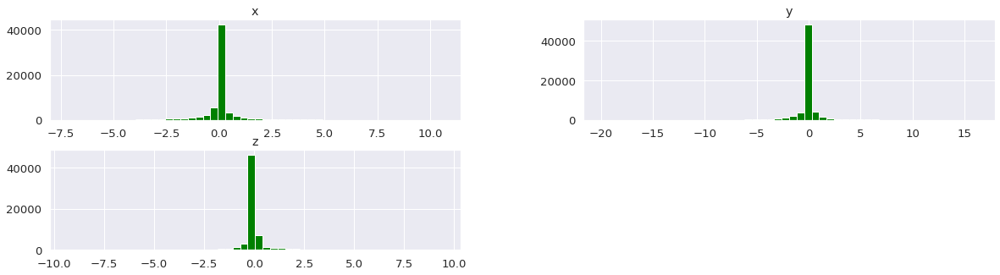

In [0]:
#T = raw_par_35_phone_ang_vel.iloc[:200]
T = raw_par_35_phone_ang_vel
T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

**Observation: zero concentrated, low level, symmetrical in all exes**

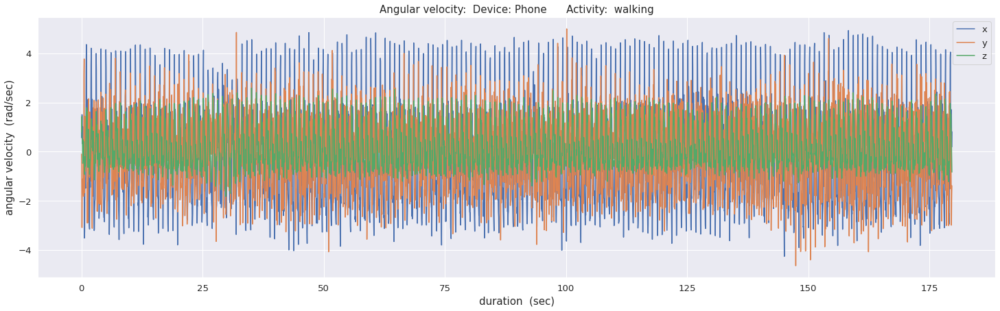

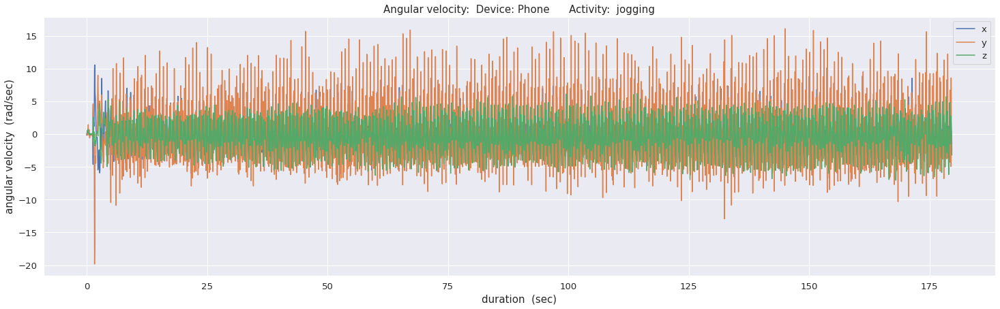

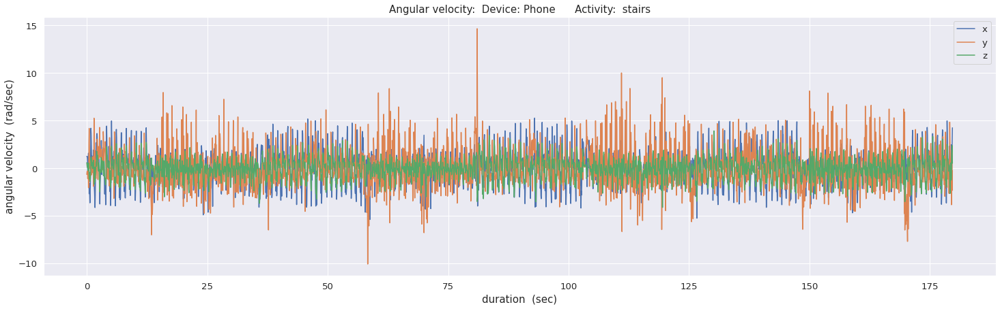

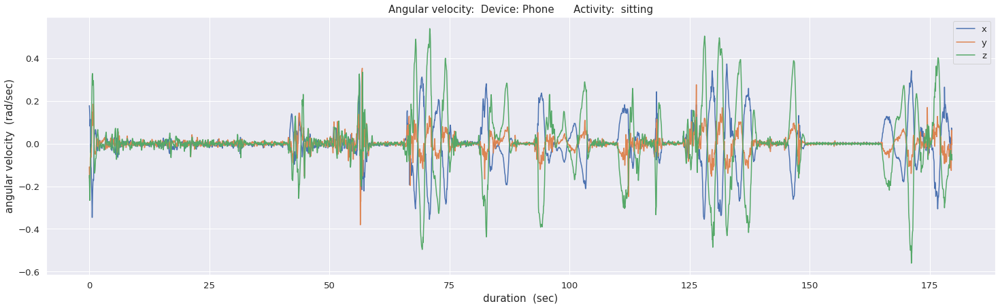

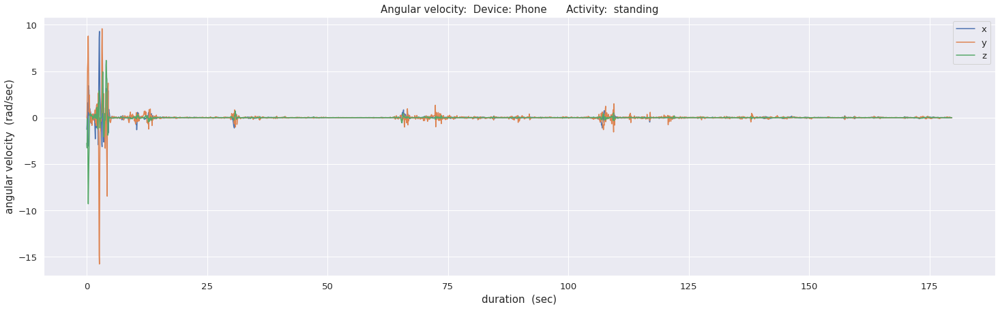

...

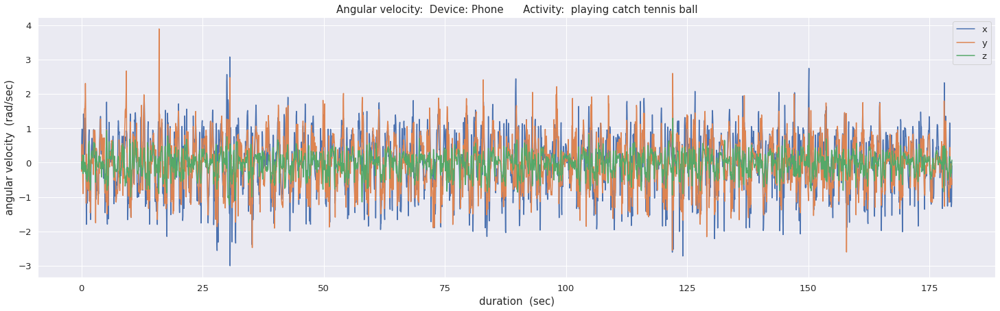

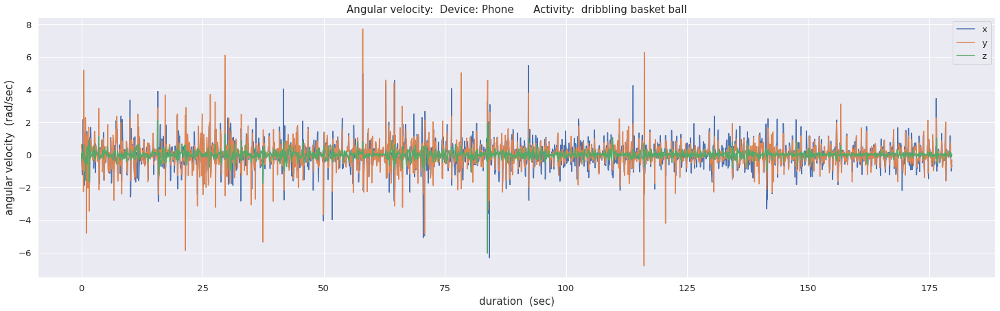

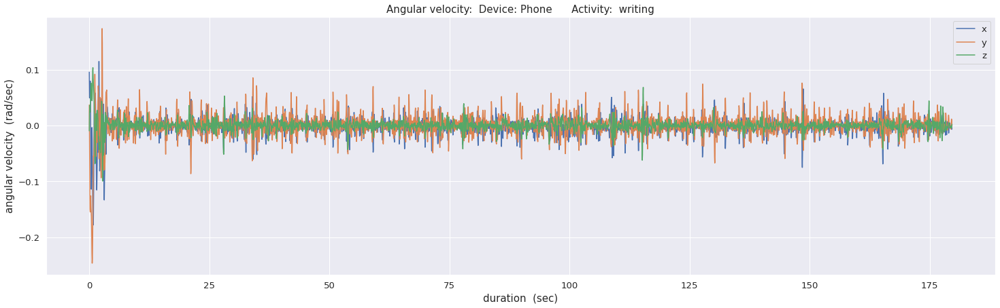

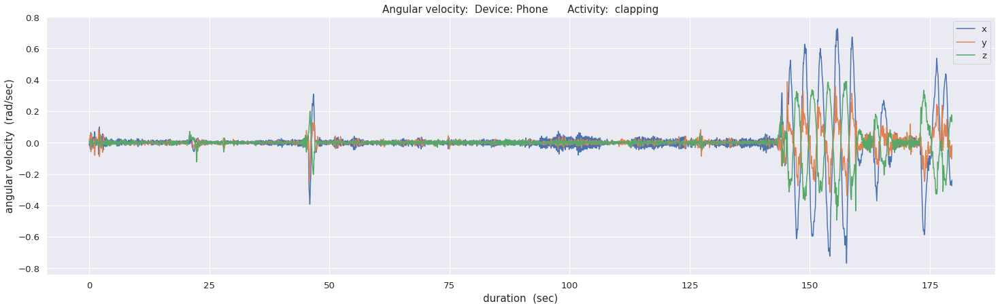

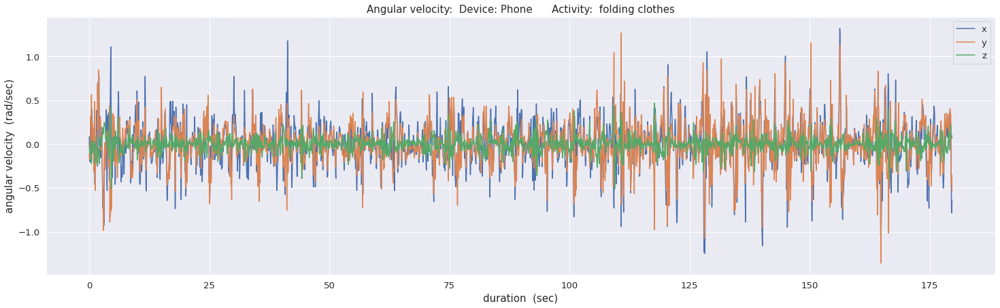

In [0]:
for key in activity_codes_mapping:
  show_ang_velocity_per_activity('Phone', raw_par_35_phone_ang_vel, activity_codes_mapping[key])

## **4) watch - angular velocity** measurement data:

**EDA typical example:  Participant no. 45 - Watch - angular velocity history**

In [0]:
raw_par_45_watch_ang_vel = pd.read_csv(r'/content/drive/My Drive/WISDM/raw/watch/gyro/data_1635_gyro_watch.txt', names = ['participant_id' , 'activity_code' , 'timestamp', 'x', 'y', 'z'], index_col=None, header=None)

raw_par_45_watch_ang_vel.z = raw_par_45_watch_ang_vel.z.str.strip(';')
raw_par_45_watch_ang_vel.z = pd.to_numeric(raw_par_45_watch_ang_vel.z)

raw_par_45_watch_ang_vel['activity'] = raw_par_45_watch_ang_vel['activity_code'].map(activity_codes_mapping)

raw_par_45_watch_ang_vel = raw_par_45_watch_ang_vel[['participant_id', 'activity_code', 'activity', 'timestamp', 'x', 'y', 'z']]

raw_par_45_watch_ang_vel

,participant_id,activity_code,activity,timestamp,x,y,z
0,1635,A,walking,64768437041043,0.117911,-0.145542,-1.300821
1,1635,A,walking,64768486541043,1.038300,-0.455534,-1.134640
2,1635,A,walking,64768536041043,0.876380,-0.541820,-0.844888
3,1635,A,walking,64768585541043,0.912599,-0.388422,-0.394281
4,1635,A,walking,64768635041043,0.048669,-0.046472,0.288553
...,...,...,...,...,...,...,...
64853,1635,S,folding clothes,68881084984774,-0.426159,0.298781,2.808190
64854,1635,S,folding clothes,68881134912344,1.008752,-0.439448,2.320299
64855,1635,S,folding clothes,68881184839914,0.938445,-0.437317,1.726947
64856,1635,S,folding clothes,68881234767484,1.552037,-0.296702,1.282732


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb5e3c24550>,
      dtype=object)

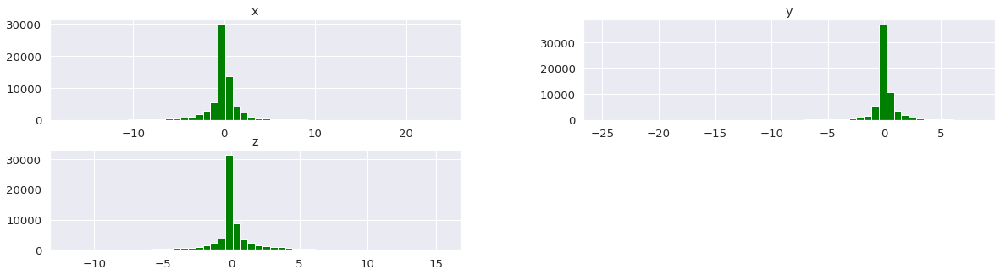

In [0]:
#T = raw_par_45_watch_ang_vel.iloc[:200]
T = raw_par_45_watch_ang_vel
T[['x', 'y', 'z']].hist(bins = 50, figsize = (20, 5), color='green')

**Observation: zero concentrated, low level, symmetrical in all exes -- however, angular velocities of hand movements are typically, greater that these of body**

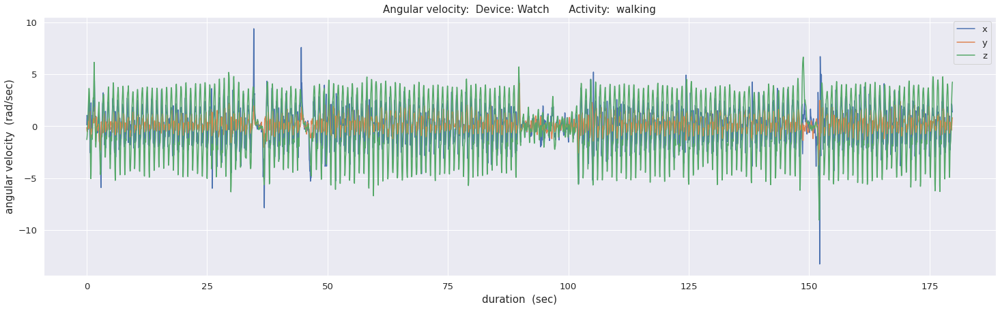

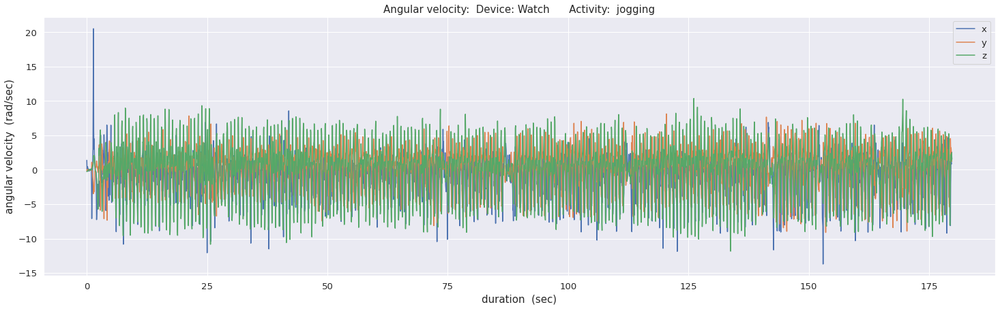

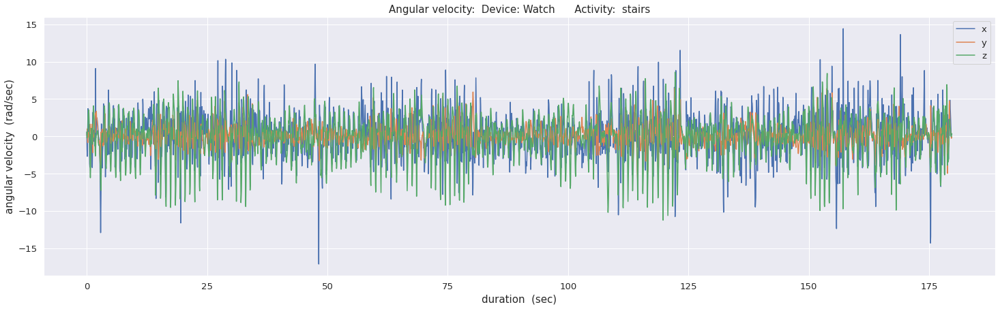

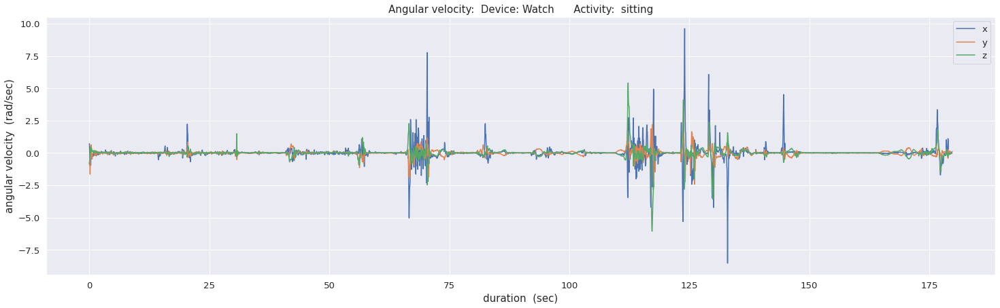

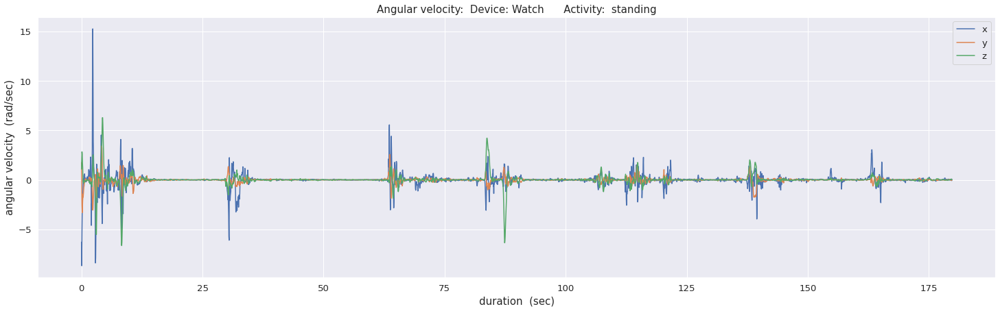

...

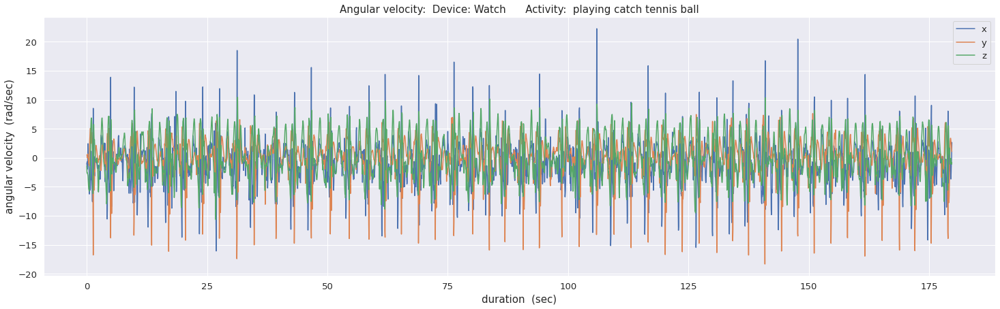

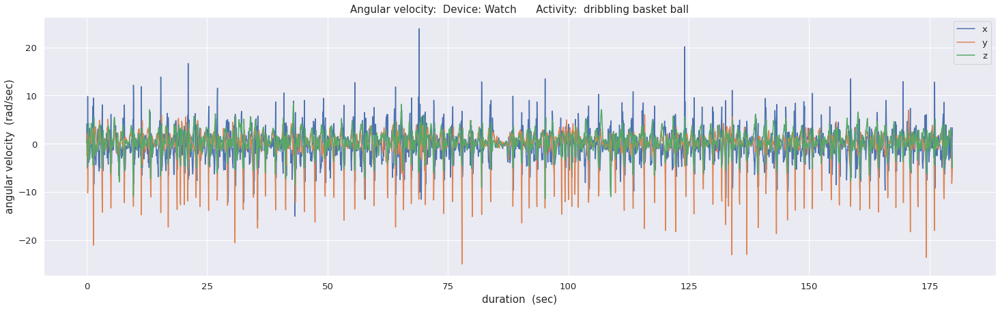

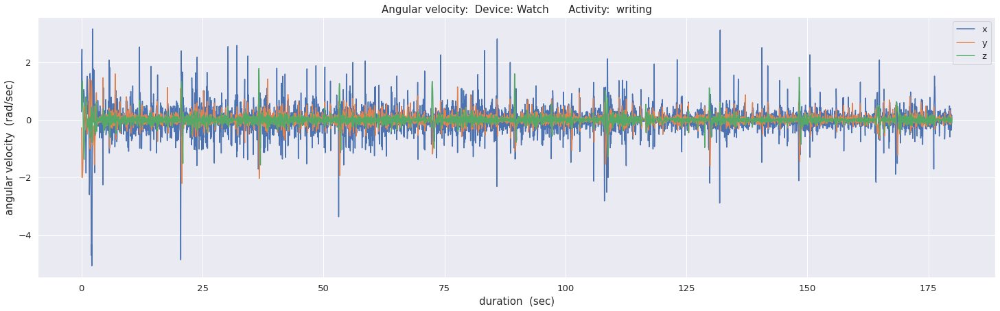

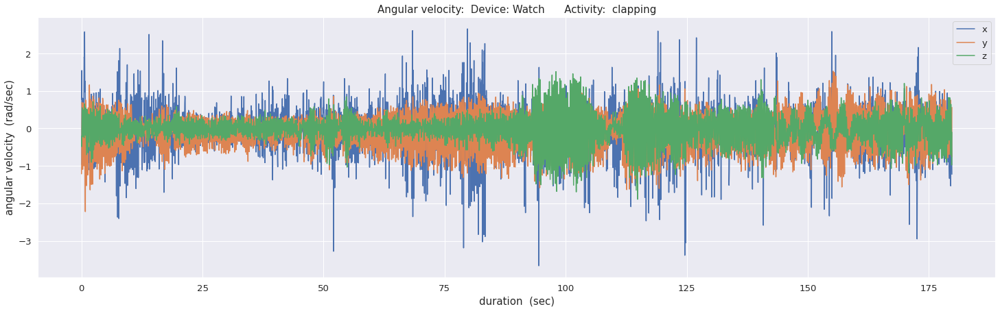

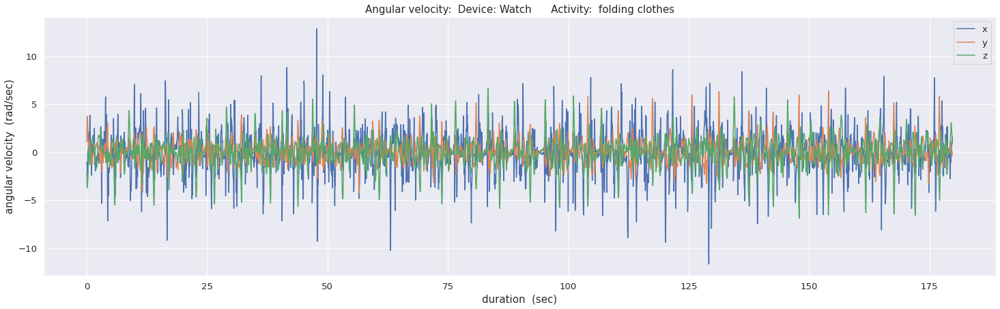

In [0]:
for key in activity_codes_mapping:
  show_ang_velocity_per_activity('Watch', raw_par_45_watch_ang_vel, activity_codes_mapping[key])



---



---



---


---
# **Construction of the Transformed, labeled dataset for the application of Machine Learning models:**
---


---



---



---



## **Features definition and Construction:**

In [0]:
features = ['ACTIVITY',
            'X0', # 1st bin fraction of x axis acceleration distribution
            'X1', # 2nd bin fraction ...
            'X2',
            'X3',
            'X4',
            'X5',
            'X6',
            'X7',
            'X8',
            'X9',
            'Y0', # 1st bin fraction of y axis acceleration distribution
            'Y1', # 2nd bin fraction ...
            'Y2',
            'Y3',
            'Y4',
            'Y5',
            'Y6',
            'Y7',
            'Y8',
            'Y9',
            'Z0', # 1st bin fraction of z axis acceleration distribution
            'Z1', # 2nd bin fraction ...
            'Z2',
            'Z3',
            'Z4',
            'Z5',
            'Z6',
            'Z7',
            'Z8',
            'Z9',
            'XAVG', # average sensor value over the window (per axis)
            'YAVG',
            'ZAVG',
            'XPEAK', # Time in milliseconds between the peaks in the wave associated with most activities. heuristically determined (per axis)
            'YPEAK',
            'ZPEAK',
            'XABSOLDEV', # Average absolute difference between the each of the 200 readings and the mean of those values (per axis)
            'YABSOLDEV',
            'ZABSOLDEV',
            'XSTANDDEV', # Standard deviation of the 200 window's values (per axis)  ***BUG!***
            'YSTANDDEV',
            'ZSTANDDEV',
            'XVAR', # Variance of the 200 window's values (per axis)   ***BUG!***
            'YVAR',
            'ZVAR',
            'XMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'XMFCC1',
            'XMFCC2',
            'XMFCC3',
            'XMFCC4',
            'XMFCC5',
            'XMFCC6',
            'XMFCC7',
            'XMFCC8',
            'XMFCC9',
            'XMFCC10',
            'XMFCC11',
            'XMFCC12',
            'YMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'YMFCC1',
            'YMFCC2',
            'YMFCC3',
            'YMFCC4',
            'YMFCC5',
            'YMFCC6',
            'YMFCC7',
            'YMFCC8',
            'YMFCC9',
            'YMFCC10',
            'YMFCC11',
            'YMFCC12',
            'ZMFCC0', # short-term power spectrum of a wave, based on a linear cosine transform of a log power spectrum on a non-linear mel scale of frequency (13 values per axis)
            'ZMFCC1',
            'ZMFCC2',
            'ZMFCC3',
            'ZMFCC4',
            'ZMFCC5',
            'ZMFCC6',
            'ZMFCC7',
            'ZMFCC8',
            'ZMFCC9',
            'ZMFCC10',
            'ZMFCC11',
            'ZMFCC12',
            'XYCOS', # The cosine distances between sensor values for pairs of axes (three pairs of axes)
            'XZCOS',
            'YZCOS',
            'XYCOR', # The correlation between sensor values for pairs of axes (three pairs of axes)
            'XZCOR',
            'YZCOR',
            'RESULTANT', # Average resultant value, computed by squaring each matching x, y, and z value, summing them, taking the square root, and then averaging these values over the 200 readings
            'PARTICIPANT'] # Categirical: 1600 -1650

len(features)

93

In [0]:
import glob

path = r'/content/drive/My Drive/WISDM/arff/phone/accel'
all_files = glob.glob(path + "/*.arff")

list_dfs_phone_accel = []

for filename in all_files:
    df = pd.read_csv(filename, names = features, skiprows = 96, index_col=None, header=0)
    list_dfs_phone_accel.append(df)

all_phone_accel = pd.concat(list_dfs_phone_accel, axis=0, ignore_index=True, sort=False)

all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,...,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT,PARTICIPANT
0,A,0.275,0.165,0.285,0.200,0.065,0.010,0.000,0.0,0.0,0.0,0.95,0.050,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.160,0.335,0.275,0.110,0.040,0.025,0.045,0.010,0.000,0.000,-0.096761,-9.95767,0.676176,43.1111,45.6098,39.3878,3.099320,3.461380,3.009820,...,0.580418,0.575679,0.570324,0.564358,0.557787,0.550620,0.472002,0.667155,0.666083,0.664298,0.661801,0.658596,0.654686,0.650074,0.644767,0.638769,0.632087,0.624728,0.616701,0.441507,0.624051,0.623049,0.621379,0.619044,0.616046,0.612388,0.608075,0.603110,0.597500,0.591250,0.584366,0.576857,0.147506,-0.618538,-0.267751,0.320121,-0.622741,-0.314829,11.35910,1632
1,A,0.305,0.245,0.210,0.170,0.055,0.010,0.005,0.0,0.0,0.0,0.93,0.070,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.250,0.300,0.125,0.040,0.055,0.020,0.010,0.020,0.005,-1.117270,-9.73222,1.092410,44.7727,41.9565,33.5088,3.680910,3.669780,3.384100,...,0.636950,0.631750,0.625873,0.619326,0.612116,0.604250,0.482390,0.681838,0.680742,0.678918,0.676366,0.673091,0.669094,0.664382,0.658957,0.652827,0.645998,0.638478,0.630273,0.465613,0.658123,0.657066,0.655305,0.652842,0.649681,0.645823,0.641274,0.636039,0.630122,0.623531,0.616271,0.608352,0.363502,-0.599742,-0.356057,0.395598,-0.578239,-0.365460,11.57660,1632
2,A,0.355,0.230,0.180,0.190,0.020,0.020,0.005,0.0,0.0,0.0,0.92,0.080,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.170,0.195,0.365,0.120,0.055,0.060,0.005,0.020,0.000,0.010,-1.167530,-9.74696,1.212580,44.6512,41.9565,33.8596,3.585800,3.509000,3.065150,...,0.639967,0.634742,0.628838,0.622260,0.615015,0.607112,0.489928,0.692492,0.691379,0.689527,0.686935,0.683609,0.679550,0.674763,0.669254,0.663028,0.656093,0.648454,0.640122,0.467087,0.660206,0.659146,0.657379,0.654909,0.651737,0.647868,0.643304,0.638052,0.632117,0.625504,0.618222,0.610278,0.341907,-0.621568,-0.398616,0.292660,-0.594464,-0.384058,11.47030,1632
3,A,0.340,0.230,0.235,0.145,0.035,0.015,0.000,0.0,0.0,0.0,0.96,0.035,0.005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.140,0.270,0.305,0.135,0.055,0.035,0.035,0.020,0.005,0.000,-1.209730,-9.87592,1.342850,49.2308,46.3415,35.7407,3.577180,3.369500,3.039630,...,0.612602,0.607600,0.601948,0.595651,0.588717,0.581152,0.476623,0.673686,0.672604,0.670801,0.668280,0.665044,0.661095,0.656439,0.651079,0.645023,0.638275,0.630844,0.622738,0.459477,0.649451,0.648407,0.646670,0.644239,0.641119,0.637313,0.632824,0.627657,0.621818,0.615314,0.608150,0.600336,0.348676,-0.640761,-0.430139,0.308299,-0.611517,-0.393626,11.50340,1632
4,A,0.330,0.200,0.190,0.185,0.080,0.015,0.000,0.0,0.0,0.0,0.96,0.040,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.285,0.245,0.130,0.035,0.055,0.040,0.015,0.010,0.010,-0.719911,-9.83760,1.383540,42.4444,45.3488,34.0351,3.772970,3.623500,3.559880,...,0.630500,0.625353,0.619535,0.613055,0.605917,0.598131,0.483619,0.683575,0.682476,0.680647,0.678090,0.674806,0.670799,0.666074,0.660636,0.654491,0.647644,0.640104,0.631879,0.480357,0.678964,0.677873,0.676057,0.673516,0.670254,0.666275,0.661582,0.656180,0.650076,0.643276,0.635787,0.627617,0.264590,-0.539173,-0.424199,0.324374,-0.524713,-0.430002,11.68250,1632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,0.085,0.870,0.045,0.000,0.000,0.000,0.000,0.0,0.0,0.0,1.00,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.215,0.785,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1.263660,-9.4966

In [0]:
all_phone_accel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20650 entries, 0 to 20649
Data columns (total 93 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ACTIVITY     20650 non-null  object 
 1   X0           20650 non-null  float64
 2   X1           20650 non-null  float64
 3   X2           20650 non-null  float64
 4   X3           20650 non-null  float64
 5   X4           20650 non-null  float64
 6   X5           20650 non-null  float64
 7   X6           20650 non-null  float64
 8   X7           20650 non-null  float64
 9   X8           20650 non-null  float64
 10  X9           20650 non-null  float64
 11  Y0           20650 non-null  float64
 12  Y1           20650 non-null  float64
 13  Y2           20650 non-null  float64
 14  Y3           20650 non-null  float64
 15  Y4           20650 non-null  float64
 16  Y5           20650 non-null  float64
 17  Y6           20650 non-null  float64
 18  Y7           20650 non-null  float64
 19  Y8  

In [0]:
all_phone_accel_breakpoint = all_phone_accel.copy()

In [0]:
all_phone_accel['ACTIVITY'].map(activity_codes_mapping).value_counts()

drinking from cup            1202
kicking soccer ball          1196
jogging                      1194
standing                     1175
brushing teeth               1174
walking                      1169
clapping                     1162
playing catch tennis ball    1161
sitting                      1155
folding clothes              1153
dribbling basket ball        1149
eating soup                  1144
eating sandwich              1134
writing                      1133
eating chips                 1128
eating pasta                 1077
stairs                       1072
typing                       1072
Name: ACTIVITY, dtype: int64

In [0]:
all_phone_accel['ACTIVITY'].map(activity_codes_mapping).value_counts().plot(kind = 'bar', figsize = (15,5), color = 'purple', title = 'row count per activity', legend = True, fontsize = 15)

NameError: ignored

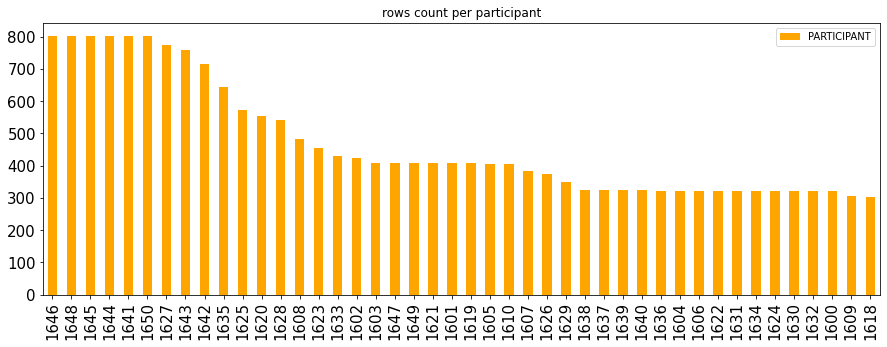

In [0]:
all_phone_accel['PARTICIPANT'].value_counts().plot(kind = 'bar', figsize = (15,5), color = 'orange', title= 'rows count per participant', legend = True, fontsize = 15)

**The following columns:'XSTANDDEV',	'YSTANDDEV',	'ZSTANDDEV'	,'XVAR',	'YVAR',	'ZVAR' are suspected to contain erroneous data: ( e.g. absolute deviation is not of the same order of magnitude of standard deviation; variance is not the square of standard deviation !!!)**

In [0]:
all_phone_accel[['XABSOLDEV', 'YABSOLDEV','ZABSOLDEV','XSTANDDEV', 'YSTANDDEV', 'ZSTANDDEV', 'XVAR', 'YVAR', 'ZVAR']].head()

,XABSOLDEV,YABSOLDEV,ZABSOLDEV,XSTANDDEV,YSTANDDEV,ZSTANDDEV,XVAR,YVAR,ZVAR
0,3.09932,3.46138,3.00982,0.278006,0.298339,0.296697,0.527262,0.546204,0.544699
1,3.68091,3.66978,3.38410,0.345169,0.315429,0.328955,0.587511,0.561630,0.573546
2,3.58580,3.50900,3.06515,0.322741,0.307855,0.303987,0.568103,0.554847,0.551350
3,3.57718,3.36950,3.03963,0.327761,0.294869,0.292434,0.572504,0.543018,0.540772
4,3.77297,3.62350,3.55988,0.345363,0.312755,0.336103,0.587676,0.559245,0.579744


**Observation: the *STANDARDDEV and *VAR contain erroneous data and therefore will, later, be dropped from the dataset!**

In [0]:
all_phone_accel.drop(['XSTANDDEV',	'YSTANDDEV',	'ZSTANDDEV'	,'XVAR',	'YVAR',	'ZVAR'], axis = 1, inplace = True)

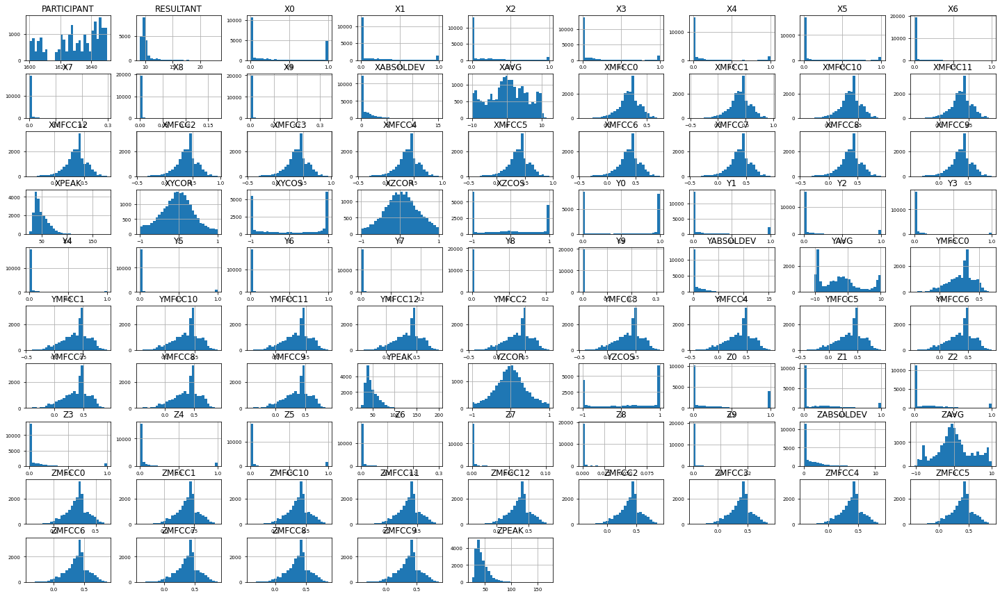

In [0]:
ax = all_phone_accel.hist(bins=30, figsize=(25, 15), xlabelsize = 7, ylabelsize = 7)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc9b18e0e48>,
      dtype=object)

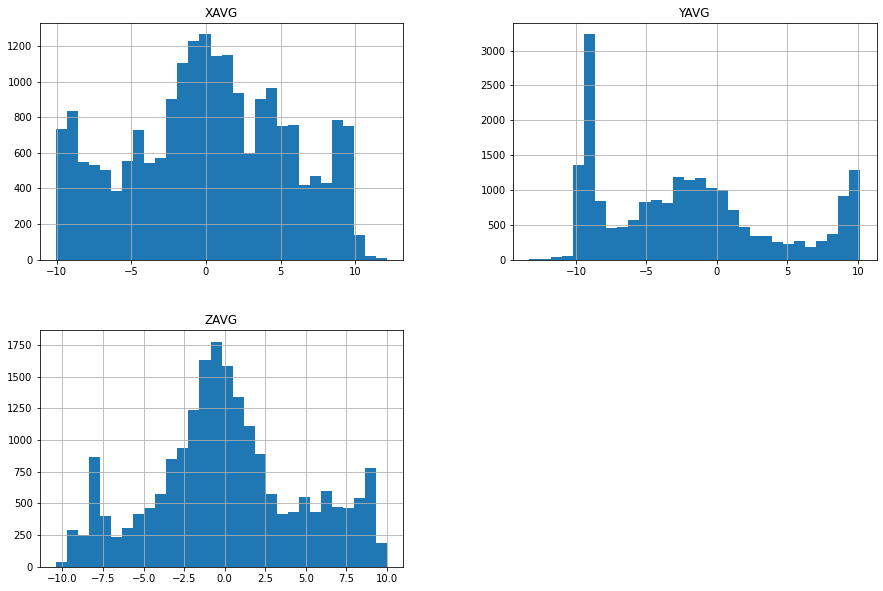

In [0]:
all_phone_accel[['XAVG', 'YAVG', 'ZAVG']].hist(bins=30, figsize=(15, 10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc9afcd3898>,
      dtype=object)

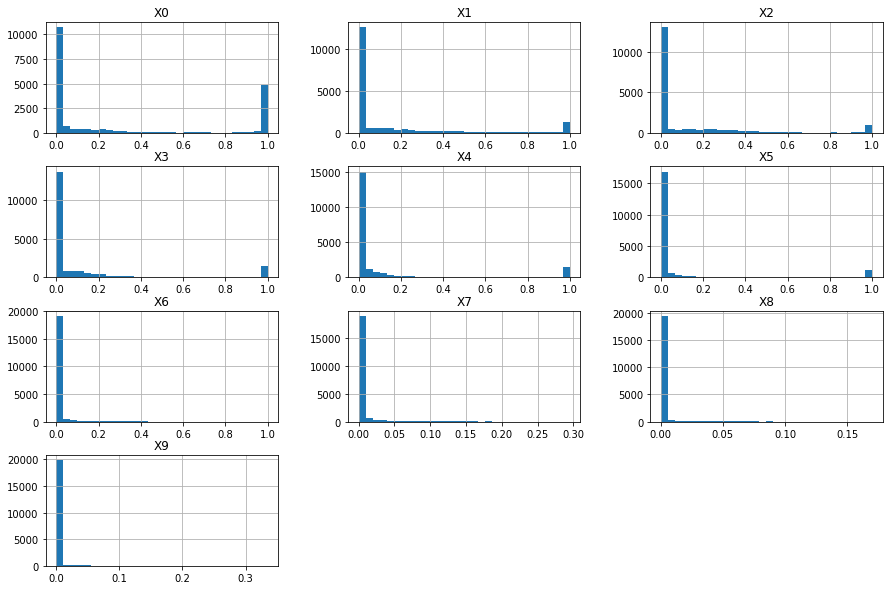

In [0]:
all_phone_accel[['X0', 'X1', 'X2', 'X3','X4','X5','X6','X7','X8','X9']].hist(bins=30, figsize=(15, 10))

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


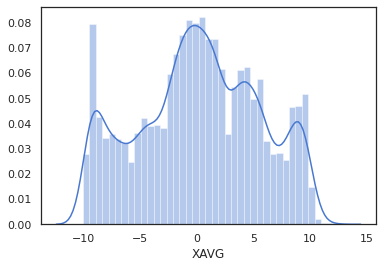

In [0]:
import seaborn as sns

sns.set(color_codes=True)
sns.set(style="white", palette="muted")
sns.distplot(all_phone_accel['XAVG'])


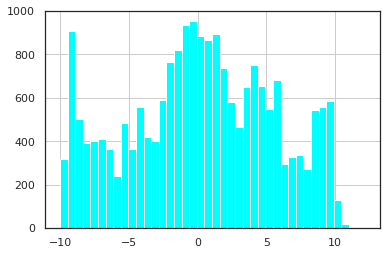

In [0]:
all_phone_accel['XAVG'].hist(bins=40, color = 'cyan')

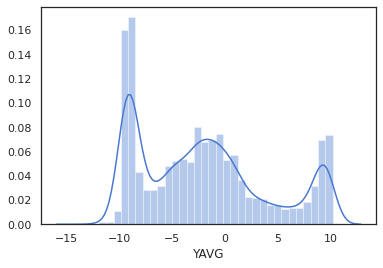

In [0]:
sns.distplot(all_phone_accel['YAVG'])

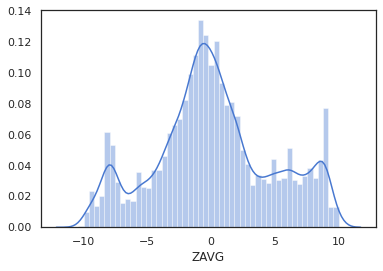

In [0]:
sns.distplot(all_phone_accel['ZAVG'])

**Observation: (bi)modal nature - corresponding the the standing - sitting postures**

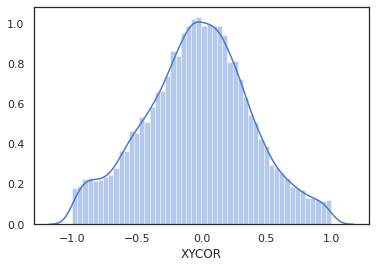

In [0]:
sns.distplot(all_phone_accel['XYCOR'])

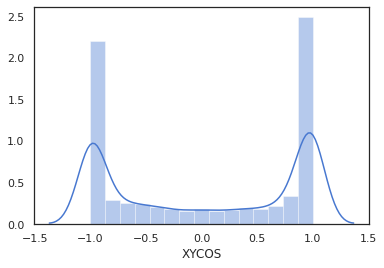

In [0]:
sns.distplot(all_phone_accel['XYCOS'])

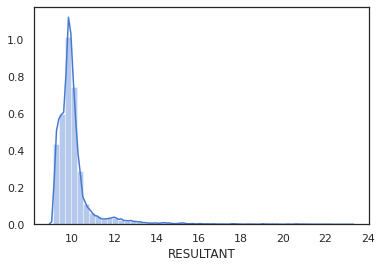

In [0]:
sns.distplot(all_phone_accel['RESULTANT'])

**Observation: resultand reflects stability around force equilibrium (1g upwards, [9.8 m/sec^2])**

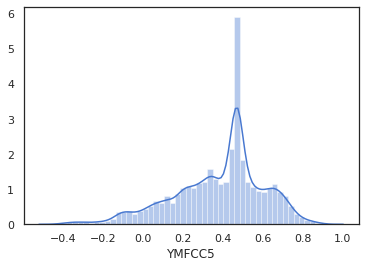

In [0]:
sns.distplot(all_phone_accel['YMFCC5'])



---



# **Cleaning and Scaling the data:**

---



**Outliers detection in XPEAK, YPEAK, ZPEAK by inspection of the histogram/boxplot:**

---



**XPEAK:**

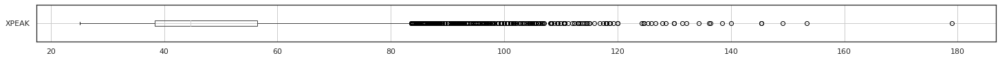

In [0]:
#all_phone_accel['XPEAK'].hist(bins=200, color = 'red', figsize = (25,50))
all_phone_accel.boxplot(column=['XPEAK'], figsize=[25,1], vert=False)

In [0]:
all_phone_accel['XPEAK'].sort_values()

11426     25.1282
11425     25.1282
11025     25.1316
11427     25.5844
11029     26.2162
           ...   
20388    145.3850
10407    145.3850
10395    149.1670
10423    153.3330
15527    179.0000
Name: XPEAK, Length: 20650, dtype: float64

In [0]:
all_phone_accel.shape

(20650, 87)

In [0]:
all_phone_accel = all_phone_accel.loc[all_phone_accel.XPEAK < 179.0]

In [0]:
all_phone_accel.shape

(20649, 87)

In [0]:
#all_phone_accel['XPEAK'].hist(bins=200, color = 'red', figsize = (25,50))

In [0]:
all_phone_accel['XPEAK'].sort_values()

11426     25.1282
11425     25.1282
11025     25.1316
11427     25.5844
11029     26.2162
           ...   
20379    140.0000
10407    145.3850
20388    145.3850
10395    149.1670
10423    153.3330
Name: XPEAK, Length: 20649, dtype: float64

**YPEAK:**

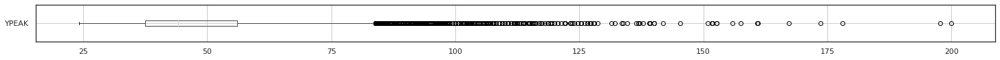

In [0]:
#all_phone_accel['YPEAK'].hist(bins=200, color = 'red', figsize = (25,100))
all_phone_accel.boxplot(column=['YPEAK'], figsize=[25,1], vert=False)

In [0]:
all_phone_accel['YPEAK'].sort_values()

2821      24.1975
2824      25.0649
11641     25.0667
2825      25.2564
17939     25.3947
           ...   
4405     167.2730
9345     173.6360
9328     178.0000
9332     197.7780
4395     200.0000
Name: YPEAK, Length: 20649, dtype: float64

In [0]:
all_phone_accel = all_phone_accel.loc[all_phone_accel.YPEAK < 197.7780]


In [0]:
all_phone_accel.shape

(20647, 87)

In [0]:
#all_phone_accel['YPEAK'].hist(bins=200, color = 'red', figsize = (25,100))

In [0]:
all_phone_accel['YPEAK'].sort_values()

2821      24.1975
2824      25.0649
11641     25.0667
2825      25.2564
17939     25.3947
           ...   
9335     160.8330
4398     161.0000
4405     167.2730
9345     173.6360
9328     178.0000
Name: YPEAK, Length: 20647, dtype: float64

**ZPEAK:**

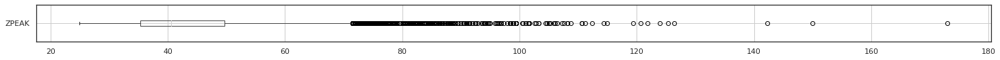

In [0]:
#all_phone_accel['ZPEAK'].hist(bins=200, color = 'red', figsize = (25,100))
all_phone_accel.boxplot(column=['ZPEAK'], figsize=[25,1], vert=False)

In [0]:
all_phone_accel.shape

(20647, 87)

In [0]:
all_phone_accel['ZPEAK'].sort_values()

13940     24.9367
13933     25.2564
356       25.3947
8639      25.4667
18186     25.4667
           ...   
892      125.3330
9586     126.4290
9219     142.3080
9554     150.0000
9560     173.0000
Name: ZPEAK, Length: 20647, dtype: float64

In [0]:
all_phone_accel = all_phone_accel.loc[all_phone_accel.ZPEAK < 140]

In [0]:
all_phone_accel.shape

(20644, 87)

In [0]:
#all_phone_accel['ZPEAK'].hist(bins=200, color = 'red', figsize = (25,100))

In [0]:
all_phone_accel['ZPEAK'].sort_values()

13940     24.9367
13933     25.2564
356       25.3947
354       25.4667
8639      25.4667
           ...   
1828     120.6250
890      121.8750
1802     124.0000
892      125.3330
9586     126.4290
Name: ZPEAK, Length: 20644, dtype: float64

**Dropping column:**


---



PARTICIPANT --- all the participant are mixed together to form the population. the effect of participant attributes variability is not analyzed in this work.


REMARK: The practice implemented in this notebook is **mixing all the participants** before the analysis.
Alternative approach would be to exploit the opportunity to inquire also the possible inter-participant variability.

i.e. to design a ML model that have a generalization ability to successfully predict the classification of test set of participants that were not included/represented , at all, in the train set.
This could be done by groups -related train-test split and grouped cross-validation. (not implemented in this notebook)

In [0]:
all_phone_accel.drop('PARTICIPANT', axis = 1, inplace = True)

In [0]:
all_phone_accel.columns

Index(['ACTIVITY', 'X0', 'X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X7', 'X8', 'X9',
       'Y0', 'Y1', 'Y2', 'Y3', 'Y4', 'Y5', 'Y6', 'Y7', 'Y8', 'Y9', 'Z0', 'Z1',
       'Z2', 'Z3', 'Z4', 'Z5', 'Z6', 'Z7', 'Z8', 'Z9', 'XAVG', 'YAVG', 'ZAVG',
       'XPEAK', 'YPEAK', 'ZPEAK', 'XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV',
       'XMFCC0', 'XMFCC1', 'XMFCC2', 'XMFCC3', 'XMFCC4', 'XMFCC5', 'XMFCC6',
       'XMFCC7', 'XMFCC8', 'XMFCC9', 'XMFCC10', 'XMFCC11', 'XMFCC12', 'YMFCC0',
       'YMFCC1', 'YMFCC2', 'YMFCC3', 'YMFCC4', 'YMFCC5', 'YMFCC6', 'YMFCC7',
       'YMFCC8', 'YMFCC9', 'YMFCC10', 'YMFCC11', 'YMFCC12', 'ZMFCC0', 'ZMFCC1',
       'ZMFCC2', 'ZMFCC3', 'ZMFCC4', 'ZMFCC5', 'ZMFCC6', 'ZMFCC7', 'ZMFCC8',
       'ZMFCC9', 'ZMFCC10', 'ZMFCC11', 'ZMFCC12', 'XYCOS', 'XZCOS', 'YZCOS',
       'XYCOR', 'XZCOR', 'YZCOR', 'RESULTANT'],
      dtype='object')

In [0]:
all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,...,XMFCC6,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,A,0.275,0.165,0.285,0.200,0.065,0.010,0.000,0.0,0.0,0.0,0.95,0.050,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.160,0.335,0.275,0.110,0.040,0.025,0.045,0.010,0.000,0.000,-0.096761,-9.95767,0.676176,43.1111,45.6098,39.3878,3.099320,3.461380,3.009820,...,0.584535,0.580418,0.575679,0.570324,0.564358,0.557787,0.550620,0.472002,0.667155,0.666083,0.664298,0.661801,0.658596,0.654686,0.650074,0.644767,0.638769,0.632087,0.624728,0.616701,0.441507,0.624051,0.623049,0.621379,0.619044,0.616046,0.612388,0.608075,0.603110,0.597500,0.591250,0.584366,0.576857,0.147506,-0.618538,-0.267751,0.320121,-0.622741,-0.314829,11.35910
1,A,0.305,0.245,0.210,0.170,0.055,0.010,0.005,0.0,0.0,0.0,0.93,0.070,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.250,0.300,0.125,0.040,0.055,0.020,0.010,0.020,0.005,-1.117270,-9.73222,1.092410,44.7727,41.9565,33.5088,3.680910,3.669780,3.384100,...,0.641469,0.636950,0.631750,0.625873,0.619326,0.612116,0.604250,0.482390,0.681838,0.680742,0.678918,0.676366,0.673091,0.669094,0.664382,0.658957,0.652827,0.645998,0.638478,0.630273,0.465613,0.658123,0.657066,0.655305,0.652842,0.649681,0.645823,0.641274,0.636039,0.630122,0.623531,0.616271,0.608352,0.363502,-0.599742,-0.356057,0.395598,-0.578239,-0.365460,11.57660
2,A,0.355,0.230,0.180,0.190,0.020,0.020,0.005,0.0,0.0,0.0,0.92,0.080,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.170,0.195,0.365,0.120,0.055,0.060,0.005,0.020,0.000,0.010,-1.167530,-9.74696,1.212580,44.6512,41.9565,33.8596,3.585800,3.509000,3.065150,...,0.644507,0.639967,0.634742,0.628838,0.622260,0.615015,0.607112,0.489928,0.692492,0.691379,0.689527,0.686935,0.683609,0.679550,0.674763,0.669254,0.663028,0.656093,0.648454,0.640122,0.467087,0.660206,0.659146,0.657379,0.654909,0.651737,0.647868,0.643304,0.638052,0.632117,0.625504,0.618222,0.610278,0.341907,-0.621568,-0.398616,0.292660,-0.594464,-0.384058,11.47030
3,A,0.340,0.230,0.235,0.145,0.035,0.015,0.000,0.0,0.0,0.0,0.96,0.035,0.005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.140,0.270,0.305,0.135,0.055,0.035,0.035,0.020,0.005,0.000,-1.209730,-9.87592,1.342850,49.2308,46.3415,35.7407,3.577180,3.369500,3.039630,...,0.616947,0.612602,0.607600,0.601948,0.595651,0.588717,0.581152,0.476623,0.673686,0.672604,0.670801,0.668280,0.665044,0.661095,0.656439,0.651079,0.645023,0.638275,0.630844,0.622738,0.459477,0.649451,0.648407,0.646670,0.644239,0.641119,0.637313,0.632824,0.627657,0.621818,0.615314,0.608150,0.600336,0.348676,-0.640761,-0.430139,0.308299,-0.611517,-0.393626,11.50340
4,A,0.330,0.200,0.190,0.185,0.080,0.015,0.000,0.0,0.0,0.0,0.96,0.040,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.285,0.245,0.130,0.035,0.055,0.040,0.015,0.010,0.010,-0.719911,-9.83760,1.383540,42.4444,45.3488,34.0351,3.772970,3.623500,3.559880,...,0.634973,0.630500,0.625353,0.619535,0.613055,0.605917,0.598131,0.483619,0.683575,0.682476,0.680647,0.678090,0.674806,0.670799,0.666074,0.660636,0.654491,0.647644,0.640104,0.631879,0.480357,0.678964,0.677873,0.676057,0.673516,0.670254,0.666275,0.661582,0.656180,0.650076,0.643276,0.635787,0.627617,0.264590,-0.539173,-0.424199,0.324374,-0.524713,-0.430002,11.68250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,0.085,0.870,0.045,0.000,0.000,0.000,0.000,0.0,0.0,0.0,1.00,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.215,0.785,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1

### **Normalization/Scaling:**

Will be implemented on sub groups of features. the rest of the features are already normalized, by definition, or nearly normalized (around 0- 1)

In [0]:
scale_factor = all_phone_accel[['XAVG', 'YAVG', 'ZAVG']].abs().max().max()

all_phone_accel['XAVG'] /= scale_factor
all_phone_accel['YAVG'] /= scale_factor
all_phone_accel['ZAVG'] /= scale_factor

all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,...,XMFCC6,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,A,0.275,0.165,0.285,0.200,0.065,0.010,0.000,0.0,0.0,0.0,0.95,0.050,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.160,0.335,0.275,0.110,0.040,0.025,0.045,0.010,0.000,0.000,-0.007264,-0.747578,0.050764,43.1111,45.6098,39.3878,3.099320,3.461380,3.009820,...,0.584535,0.580418,0.575679,0.570324,0.564358,0.557787,0.550620,0.472002,0.667155,0.666083,0.664298,0.661801,0.658596,0.654686,0.650074,0.644767,0.638769,0.632087,0.624728,0.616701,0.441507,0.624051,0.623049,0.621379,0.619044,0.616046,0.612388,0.608075,0.603110,0.597500,0.591250,0.584366,0.576857,0.147506,-0.618538,-0.267751,0.320121,-0.622741,-0.314829,11.35910
1,A,0.305,0.245,0.210,0.170,0.055,0.010,0.005,0.0,0.0,0.0,0.93,0.070,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.250,0.300,0.125,0.040,0.055,0.020,0.010,0.020,0.005,-0.083880,-0.730653,0.082013,44.7727,41.9565,33.5088,3.680910,3.669780,3.384100,...,0.641469,0.636950,0.631750,0.625873,0.619326,0.612116,0.604250,0.482390,0.681838,0.680742,0.678918,0.676366,0.673091,0.669094,0.664382,0.658957,0.652827,0.645998,0.638478,0.630273,0.465613,0.658123,0.657066,0.655305,0.652842,0.649681,0.645823,0.641274,0.636039,0.630122,0.623531,0.616271,0.608352,0.363502,-0.599742,-0.356057,0.395598,-0.578239,-0.365460,11.57660
2,A,0.355,0.230,0.180,0.190,0.020,0.020,0.005,0.0,0.0,0.0,0.92,0.080,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.170,0.195,0.365,0.120,0.055,0.060,0.005,0.020,0.000,0.010,-0.087653,-0.731759,0.091035,44.6512,41.9565,33.8596,3.585800,3.509000,3.065150,...,0.644507,0.639967,0.634742,0.628838,0.622260,0.615015,0.607112,0.489928,0.692492,0.691379,0.689527,0.686935,0.683609,0.679550,0.674763,0.669254,0.663028,0.656093,0.648454,0.640122,0.467087,0.660206,0.659146,0.657379,0.654909,0.651737,0.647868,0.643304,0.638052,0.632117,0.625504,0.618222,0.610278,0.341907,-0.621568,-0.398616,0.292660,-0.594464,-0.384058,11.47030
3,A,0.340,0.230,0.235,0.145,0.035,0.015,0.000,0.0,0.0,0.0,0.96,0.035,0.005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.140,0.270,0.305,0.135,0.055,0.035,0.035,0.020,0.005,0.000,-0.090821,-0.741441,0.100815,49.2308,46.3415,35.7407,3.577180,3.369500,3.039630,...,0.616947,0.612602,0.607600,0.601948,0.595651,0.588717,0.581152,0.476623,0.673686,0.672604,0.670801,0.668280,0.665044,0.661095,0.656439,0.651079,0.645023,0.638275,0.630844,0.622738,0.459477,0.649451,0.648407,0.646670,0.644239,0.641119,0.637313,0.632824,0.627657,0.621818,0.615314,0.608150,0.600336,0.348676,-0.640761,-0.430139,0.308299,-0.611517,-0.393626,11.50340
4,A,0.330,0.200,0.190,0.185,0.080,0.015,0.000,0.0,0.0,0.0,0.96,0.040,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.285,0.245,0.130,0.035,0.055,0.040,0.015,0.010,0.010,-0.054048,-0.738564,0.103870,42.4444,45.3488,34.0351,3.772970,3.623500,3.559880,...,0.634973,0.630500,0.625353,0.619535,0.613055,0.605917,0.598131,0.483619,0.683575,0.682476,0.680647,0.678090,0.674806,0.670799,0.666074,0.660636,0.654491,0.647644,0.640104,0.631879,0.480357,0.678964,0.677873,0.676057,0.673516,0.670254,0.666275,0.661582,0.656180,0.650076,0.643276,0.635787,0.627617,0.264590,-0.539173,-0.424199,0.324374,-0.524713,-0.430002,11.68250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,0.085,0.870,0.045,0.000,0.000,0.000,0.000,0.0,0.0,0.0,1.00,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.215,0.785,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

In [0]:
scale_factor = all_phone_accel[['XABSOLDEV', 'YABSOLDEV', 'ZABSOLDEV']].abs().max().max()

all_phone_accel['XABSOLDEV'] /= scale_factor
all_phone_accel['YABSOLDEV'] /= scale_factor
all_phone_accel['ZABSOLDEV'] /= scale_factor

all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,...,XMFCC6,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,A,0.275,0.165,0.285,0.200,0.065,0.010,0.000,0.0,0.0,0.0,0.95,0.050,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.160,0.335,0.275,0.110,0.040,0.025,0.045,0.010,0.000,0.000,-0.007264,-0.747578,0.050764,43.1111,45.6098,39.3878,0.201994,0.225591,0.196161,...,0.584535,0.580418,0.575679,0.570324,0.564358,0.557787,0.550620,0.472002,0.667155,0.666083,0.664298,0.661801,0.658596,0.654686,0.650074,0.644767,0.638769,0.632087,0.624728,0.616701,0.441507,0.624051,0.623049,0.621379,0.619044,0.616046,0.612388,0.608075,0.603110,0.597500,0.591250,0.584366,0.576857,0.147506,-0.618538,-0.267751,0.320121,-0.622741,-0.314829,11.35910
1,A,0.305,0.245,0.210,0.170,0.055,0.010,0.005,0.0,0.0,0.0,0.93,0.070,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.250,0.300,0.125,0.040,0.055,0.020,0.010,0.020,0.005,-0.083880,-0.730653,0.082013,44.7727,41.9565,33.5088,0.239899,0.239173,0.220554,...,0.641469,0.636950,0.631750,0.625873,0.619326,0.612116,0.604250,0.482390,0.681838,0.680742,0.678918,0.676366,0.673091,0.669094,0.664382,0.658957,0.652827,0.645998,0.638478,0.630273,0.465613,0.658123,0.657066,0.655305,0.652842,0.649681,0.645823,0.641274,0.636039,0.630122,0.623531,0.616271,0.608352,0.363502,-0.599742,-0.356057,0.395598,-0.578239,-0.365460,11.57660
2,A,0.355,0.230,0.180,0.190,0.020,0.020,0.005,0.0,0.0,0.0,0.92,0.080,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.170,0.195,0.365,0.120,0.055,0.060,0.005,0.020,0.000,0.010,-0.087653,-0.731759,0.091035,44.6512,41.9565,33.8596,0.233700,0.228695,0.199767,...,0.644507,0.639967,0.634742,0.628838,0.622260,0.615015,0.607112,0.489928,0.692492,0.691379,0.689527,0.686935,0.683609,0.679550,0.674763,0.669254,0.663028,0.656093,0.648454,0.640122,0.467087,0.660206,0.659146,0.657379,0.654909,0.651737,0.647868,0.643304,0.638052,0.632117,0.625504,0.618222,0.610278,0.341907,-0.621568,-0.398616,0.292660,-0.594464,-0.384058,11.47030
3,A,0.340,0.230,0.235,0.145,0.035,0.015,0.000,0.0,0.0,0.0,0.96,0.035,0.005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.140,0.270,0.305,0.135,0.055,0.035,0.035,0.020,0.005,0.000,-0.090821,-0.741441,0.100815,49.2308,46.3415,35.7407,0.233138,0.219603,0.198104,...,0.616947,0.612602,0.607600,0.601948,0.595651,0.588717,0.581152,0.476623,0.673686,0.672604,0.670801,0.668280,0.665044,0.661095,0.656439,0.651079,0.645023,0.638275,0.630844,0.622738,0.459477,0.649451,0.648407,0.646670,0.644239,0.641119,0.637313,0.632824,0.627657,0.621818,0.615314,0.608150,0.600336,0.348676,-0.640761,-0.430139,0.308299,-0.611517,-0.393626,11.50340
4,A,0.330,0.200,0.190,0.185,0.080,0.015,0.000,0.0,0.0,0.0,0.96,0.040,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.285,0.245,0.130,0.035,0.055,0.040,0.015,0.010,0.010,-0.054048,-0.738564,0.103870,42.4444,45.3488,34.0351,0.245899,0.236157,0.232011,...,0.634973,0.630500,0.625353,0.619535,0.613055,0.605917,0.598131,0.483619,0.683575,0.682476,0.680647,0.678090,0.674806,0.670799,0.666074,0.660636,0.654491,0.647644,0.640104,0.631879,0.480357,0.678964,0.677873,0.676057,0.673516,0.670254,0.666275,0.661582,0.656180,0.650076,0.643276,0.635787,0.627617,0.264590,-0.539173,-0.424199,0.324374,-0.524713,-0.430002,11.68250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,0.085,0.870,0.045,0.000,0.000,0.000,0.000,0.0,0.0,0.0,1.00,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.215,0.785,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.0

In [0]:
scale_factor = all_phone_accel[['XPEAK', 'YPEAK', 'ZPEAK']].abs().max().max()

all_phone_accel['XPEAK'] /= scale_factor
all_phone_accel['YPEAK'] /= scale_factor
all_phone_accel['ZPEAK'] /= scale_factor

all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,...,XMFCC6,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,A,0.275,0.165,0.285,0.200,0.065,0.010,0.000,0.0,0.0,0.0,0.95,0.050,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.160,0.335,0.275,0.110,0.040,0.025,0.045,0.010,0.000,0.000,-0.007264,-0.747578,0.050764,0.242197,0.256235,0.221280,0.201994,0.225591,0.196161,...,0.584535,0.580418,0.575679,0.570324,0.564358,0.557787,0.550620,0.472002,0.667155,0.666083,0.664298,0.661801,0.658596,0.654686,0.650074,0.644767,0.638769,0.632087,0.624728,0.616701,0.441507,0.624051,0.623049,0.621379,0.619044,0.616046,0.612388,0.608075,0.603110,0.597500,0.591250,0.584366,0.576857,0.147506,-0.618538,-0.267751,0.320121,-0.622741,-0.314829,11.35910
1,A,0.305,0.245,0.210,0.170,0.055,0.010,0.005,0.0,0.0,0.0,0.93,0.070,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.250,0.300,0.125,0.040,0.055,0.020,0.010,0.020,0.005,-0.083880,-0.730653,0.082013,0.251532,0.235711,0.188252,0.239899,0.239173,0.220554,...,0.641469,0.636950,0.631750,0.625873,0.619326,0.612116,0.604250,0.482390,0.681838,0.680742,0.678918,0.676366,0.673091,0.669094,0.664382,0.658957,0.652827,0.645998,0.638478,0.630273,0.465613,0.658123,0.657066,0.655305,0.652842,0.649681,0.645823,0.641274,0.636039,0.630122,0.623531,0.616271,0.608352,0.363502,-0.599742,-0.356057,0.395598,-0.578239,-0.365460,11.57660
2,A,0.355,0.230,0.180,0.190,0.020,0.020,0.005,0.0,0.0,0.0,0.92,0.080,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.170,0.195,0.365,0.120,0.055,0.060,0.005,0.020,0.000,0.010,-0.087653,-0.731759,0.091035,0.250849,0.235711,0.190222,0.233700,0.228695,0.199767,...,0.644507,0.639967,0.634742,0.628838,0.622260,0.615015,0.607112,0.489928,0.692492,0.691379,0.689527,0.686935,0.683609,0.679550,0.674763,0.669254,0.663028,0.656093,0.648454,0.640122,0.467087,0.660206,0.659146,0.657379,0.654909,0.651737,0.647868,0.643304,0.638052,0.632117,0.625504,0.618222,0.610278,0.341907,-0.621568,-0.398616,0.292660,-0.594464,-0.384058,11.47030
3,A,0.340,0.230,0.235,0.145,0.035,0.015,0.000,0.0,0.0,0.0,0.96,0.035,0.005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.140,0.270,0.305,0.135,0.055,0.035,0.035,0.020,0.005,0.000,-0.090821,-0.741441,0.100815,0.276578,0.260346,0.200790,0.233138,0.219603,0.198104,...,0.616947,0.612602,0.607600,0.601948,0.595651,0.588717,0.581152,0.476623,0.673686,0.672604,0.670801,0.668280,0.665044,0.661095,0.656439,0.651079,0.645023,0.638275,0.630844,0.622738,0.459477,0.649451,0.648407,0.646670,0.644239,0.641119,0.637313,0.632824,0.627657,0.621818,0.615314,0.608150,0.600336,0.348676,-0.640761,-0.430139,0.308299,-0.611517,-0.393626,11.50340
4,A,0.330,0.200,0.190,0.185,0.080,0.015,0.000,0.0,0.0,0.0,0.96,0.040,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.285,0.245,0.130,0.035,0.055,0.040,0.015,0.010,0.010,-0.054048,-0.738564,0.103870,0.238452,0.254769,0.191208,0.245899,0.236157,0.232011,...,0.634973,0.630500,0.625353,0.619535,0.613055,0.605917,0.598131,0.483619,0.683575,0.682476,0.680647,0.678090,0.674806,0.670799,0.666074,0.660636,0.654491,0.647644,0.640104,0.631879,0.480357,0.678964,0.677873,0.676057,0.673516,0.670254,0.666275,0.661582,0.656180,0.650076,0.643276,0.635787,0.627617,0.264590,-0.539173,-0.424199,0.324374,-0.524713,-0.430002,11.68250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,0.085,0.870,0.045,0.000,0.000,0.000,0.000,0.0,0.0,0.0,1.00,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.215,0.785,0.000,0.000,0.000,0.000,0.000,

In [0]:
scale_factor = all_phone_accel['RESULTANT'].abs().max()

all_phone_accel['RESULTANT'] /= scale_factor

all_phone_accel

,ACTIVITY,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,...,XMFCC6,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
0,A,0.275,0.165,0.285,0.200,0.065,0.010,0.000,0.0,0.0,0.0,0.95,0.050,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.160,0.335,0.275,0.110,0.040,0.025,0.045,0.010,0.000,0.000,-0.007264,-0.747578,0.050764,0.242197,0.256235,0.221280,0.201994,0.225591,0.196161,...,0.584535,0.580418,0.575679,0.570324,0.564358,0.557787,0.550620,0.472002,0.667155,0.666083,0.664298,0.661801,0.658596,0.654686,0.650074,0.644767,0.638769,0.632087,0.624728,0.616701,0.441507,0.624051,0.623049,0.621379,0.619044,0.616046,0.612388,0.608075,0.603110,0.597500,0.591250,0.584366,0.576857,0.147506,-0.618538,-0.267751,0.320121,-0.622741,-0.314829,0.490570
1,A,0.305,0.245,0.210,0.170,0.055,0.010,0.005,0.0,0.0,0.0,0.93,0.070,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.250,0.300,0.125,0.040,0.055,0.020,0.010,0.020,0.005,-0.083880,-0.730653,0.082013,0.251532,0.235711,0.188252,0.239899,0.239173,0.220554,...,0.641469,0.636950,0.631750,0.625873,0.619326,0.612116,0.604250,0.482390,0.681838,0.680742,0.678918,0.676366,0.673091,0.669094,0.664382,0.658957,0.652827,0.645998,0.638478,0.630273,0.465613,0.658123,0.657066,0.655305,0.652842,0.649681,0.645823,0.641274,0.636039,0.630122,0.623531,0.616271,0.608352,0.363502,-0.599742,-0.356057,0.395598,-0.578239,-0.365460,0.499963
2,A,0.355,0.230,0.180,0.190,0.020,0.020,0.005,0.0,0.0,0.0,0.92,0.080,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.170,0.195,0.365,0.120,0.055,0.060,0.005,0.020,0.000,0.010,-0.087653,-0.731759,0.091035,0.250849,0.235711,0.190222,0.233700,0.228695,0.199767,...,0.644507,0.639967,0.634742,0.628838,0.622260,0.615015,0.607112,0.489928,0.692492,0.691379,0.689527,0.686935,0.683609,0.679550,0.674763,0.669254,0.663028,0.656093,0.648454,0.640122,0.467087,0.660206,0.659146,0.657379,0.654909,0.651737,0.647868,0.643304,0.638052,0.632117,0.625504,0.618222,0.610278,0.341907,-0.621568,-0.398616,0.292660,-0.594464,-0.384058,0.495372
3,A,0.340,0.230,0.235,0.145,0.035,0.015,0.000,0.0,0.0,0.0,0.96,0.035,0.005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.140,0.270,0.305,0.135,0.055,0.035,0.035,0.020,0.005,0.000,-0.090821,-0.741441,0.100815,0.276578,0.260346,0.200790,0.233138,0.219603,0.198104,...,0.616947,0.612602,0.607600,0.601948,0.595651,0.588717,0.581152,0.476623,0.673686,0.672604,0.670801,0.668280,0.665044,0.661095,0.656439,0.651079,0.645023,0.638275,0.630844,0.622738,0.459477,0.649451,0.648407,0.646670,0.644239,0.641119,0.637313,0.632824,0.627657,0.621818,0.615314,0.608150,0.600336,0.348676,-0.640761,-0.430139,0.308299,-0.611517,-0.393626,0.496802
4,A,0.330,0.200,0.190,0.185,0.080,0.015,0.000,0.0,0.0,0.0,0.96,0.040,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.175,0.285,0.245,0.130,0.035,0.055,0.040,0.015,0.010,0.010,-0.054048,-0.738564,0.103870,0.238452,0.254769,0.191208,0.245899,0.236157,0.232011,...,0.634973,0.630500,0.625353,0.619535,0.613055,0.605917,0.598131,0.483619,0.683575,0.682476,0.680647,0.678090,0.674806,0.670799,0.666074,0.660636,0.654491,0.647644,0.640104,0.631879,0.480357,0.678964,0.677873,0.676057,0.673516,0.670254,0.666275,0.661582,0.656180,0.650076,0.643276,0.635787,0.627617,0.264590,-0.539173,-0.424199,0.324374,-0.524713,-0.430002,0.504537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20645,S,0.085,0.870,0.045,0.000,0.000,0.000,0.000,0.0,0.0,0.0,1.00,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.215,0.785,0.000,0.000,0.000,0.000,0.000,

## **Special visualization of triples of features clustering pattern**

Because of the fact that the features in the transformed dataset can, logically, be grouped in triples (corresponding to the X, Y, Z geometric axes), there is a rare opportunity to assess the capability of the features to separate the associated classes by visualization via a rotating perspective plot. (thanks to plotly.express library)

**Comment**: the graph data for the *individual* example participants were fetched directly from the arff files and not taken fron the above processed dataframe all_phone_accel (for simplicity)

---

Example 1: Participant 23 phone accel Features: XAVG  YAVG  ZAVG


---

In [0]:
fn = r'/content/drive/My Drive/WISDM/arff/phone/accel/data_1623_accel_phone.arff'
par_23_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_23_df['ACT'] = par_23_df['ACTIVITY'].map(activity_codes_mapping)

In [0]:
import plotly.express as px

fig = px.scatter_3d(par_23_df, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()





---

Example 2: Participant 40 phone accel Features: XABSULTEV  YABSULDEV  ZABSULDEV


---





In [0]:
fn = r'/content/drive/My Drive/WISDM/arff/phone/accel/data_1640_accel_phone.arff'
par_40_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_40_df['ACT'] = par_40_df['ACTIVITY'].map(activity_codes_mapping)

In [0]:
import plotly.express as px

fig = px.scatter_3d(par_40_df, x='XABSOLDEV', y='YABSOLDEV', z='ZABSOLDEV', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

Example 3: Participant 35 phone accel Features: XMFCC7  YMFCC7  ZMFCC7


---

In [0]:
fn = r'/content/drive/My Drive/WISDM/arff/phone/accel/data_1635_accel_phone.arff'
par_35_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_35_df['ACT'] = par_35_df['ACTIVITY'].map(activity_codes_mapping)

In [0]:
import plotly.express as px

fig = px.scatter_3d(par_35_df, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height = 1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

Example 4: Participant 0 phone accel Features: X5  Y5  Z5


---

In [0]:
fn = r'/content/drive/My Drive/WISDM/arff/phone/accel/data_1640_accel_phone.arff'
par_0_df = pd.read_csv(fn, names = features, skiprows = 96, index_col=None, header=0)
par_0_df['ACT'] = par_0_df['ACTIVITY'].map(activity_codes_mapping)

In [0]:
import plotly.express as px

fig = px.scatter_3d(par_0_df, x='X5', y='Y5', z='Z5', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

Example 5: Participant 0 phone accel Features: XAVG YAVG ZAVG


---

In [0]:
import plotly.express as px

fig = px.scatter_3d(par_0_df, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    height=1000,
                    width=1750,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()

---

Examole 6: All participants:  phone accel  features: XAVG  YAVG  ZAVG


---

In [0]:
import plotly.express as px

all_pa = all_phone_accel.copy()
all_pa['ACT'] = all_pa['ACTIVITY'].map(activity_codes_mapping)

fig = px.scatter_3d(all_pa, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XABSOLDEV', y='YABSOLDEV', z='ZABSOLDEV', color ='ACT')
#fig = px.scatter_3d(all_pa, x='XYCOS', y='XZCOS', z='YZCOS', color ='ACTIVITY')
#fig = px.scatter_3d(all_pa, x='X9', y='Y9', z='Z9', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XYCOR', y='XZCOR', z='YZCOR', color ='ACTIVITY')

#fig = px.scatter_3d(all_pa, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACTIVITY')

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=1800,
                    height = 1000,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()


---

Examole 7: All participants:  phone accel  features: XMFCC7  YMFCC7  ZMFCC7


---

In [0]:
import plotly.express as px


#all_pa['ACT'] = all_pa['ACTIVITY'].map(activity_codes_mapping)

#fig = px.scatter_3d(all_pa, x='XAVG', y='YAVG', z='ZAVG', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XABSOLDEV', y='YABSOLDEV', z='ZABSOLDEV', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XYCOS', y='XZCOS', z='YZCOS', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='X5', y='Y5', z='Z5', color ='ACT', color_discrete_map = activity_color_map)
#fig = px.scatter_3d(all_pa, x='XYCOR', y='XZCOR', z='YZCOR', color ='ACT', color_discrete_map = activity_color_map)

fig = px.scatter_3d(all_pa, x='XMFCC7', y='YMFCC7', z='ZMFCC7', color ='ACT', color_discrete_map = activity_color_map)

fig.update_layout(scene = dict(
                    xaxis = dict(
                         backgroundcolor="rgb(200, 200, 230)",
                         gridcolor="white",
                         showbackground=True,
                         zerolinecolor="white",),
                    yaxis = dict(
                        backgroundcolor="rgb(230, 200,230)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white"),
                    zaxis = dict(
                        backgroundcolor="rgb(230, 230,200)",
                        gridcolor="white",
                        showbackground=True,
                        zerolinecolor="white",),),
                    width=1800,
                    height = 1000,
                    margin=dict(
                    r=10, l=10,
                    b=10, t=10)
                  )


fig.show()


## **Application of Machine Learning Classification Models:**

import of modules for the modeling:

In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time

# For the tree visualization
import pydot
from IPython.display import Image
from sklearn.externals.six import StringIO

# For the dimensionality reduction
from sklearn.feature_selection import SelectKBest , f_classif

# For the tree models
from sklearn.metrics import log_loss
from sklearn.tree import DecisionTreeClassifier, export_graphviz

from sklearn.model_selection import train_test_split, GridSearchCV


from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
import warnings


!pip install pydot
import pydot
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


**Train - Test Split of the dataset:**

In [0]:
y = all_phone_accel.ACTIVITY
X = all_phone_accel.drop('ACTIVITY', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size=0.75, 
                                                    test_size=0.25,
                                                    shuffle=True, 
                                                    stratify=all_phone_accel.ACTIVITY)
X_train

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,XMFCC0,...,XMFCC6,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
11736,0.000,0.00,0.000,0.000,1.000,0.00,0.000,0.000,0.000,0.00,1.000,0.000,0.00,0.0,0.0,0.000,0.000,0.0,0.0,0.0,1.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.494091,-0.319273,-0.444350,0.187912,0.196119,0.204192,0.010725,0.038141,0.024948,0.286605,...,0.397533,0.394733,0.391510,0.387868,0.383810,0.379342,0.374468,0.244089,0.345010,0.344455,0.343532,0.342241,0.340584,0.338562,0.336177,0.333432,0.330330,0.326875,0.323069,0.318918,0.266343,0.376464,0.375860,0.374852,0.373444,0.371635,0.369429,0.366826,0.363831,0.360447,0.356676,0.352524,0.347994,-0.985169,-0.996084,0.970337,0.193970,-0.066993,-0.926711,0.425777
19120,1.000,0.00,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,0.975,0.025,0.00,0.0,0.0,0.000,0.000,0.0,0.0,0.0,0.000,0.000,0.000,0.000,0.700,0.3,0.0,0.0,0.0,0.0,-0.374734,-0.282124,0.557684,0.217978,0.276463,0.194623,0.017357,0.021970,0.015835,0.252768,...,0.350599,0.348130,0.345288,0.342076,0.338497,0.334556,0.330257,0.227894,0.322118,0.321601,0.320739,0.319534,0.317986,0.316098,0.313872,0.311309,0.308413,0.305187,0.301634,0.297758,0.309388,0.437307,0.436604,0.435434,0.433798,0.431697,0.429134,0.426111,0.422632,0.418701,0.414321,0.409497,0.404235,0.991311,-0.995360,-0.988805,0.155073,0.459552,0.497154,0.420064
4898,1.000,0.00,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,0.000,1.000,0.00,0.0,0.0,0.000,0.000,0.0,0.0,0.0,0.000,1.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,-0.702617,-0.062504,-0.091105,0.211501,0.200204,0.238764,0.000572,0.000661,0.001857,0.336223,...,0.466354,0.463069,0.459289,0.455016,0.450256,0.445014,0.439296,-0.013241,-0.018715,-0.018685,-0.018635,-0.018565,-0.018475,-0.018366,-0.018236,-0.018087,-0.017919,-0.017732,-0.017525,-0.017300,0.042791,0.060483,0.060386,0.060224,0.059998,0.059708,0.059353,0.058935,0.058454,0.057910,0.057304,0.056637,0.055909,0.999886,0.999583,0.999463,0.193293,-0.350578,-0.037430,0.409151
19325,1.000,0.00,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,1.000,0.000,0.00,0.0,0.0,0.000,0.000,0.0,0.0,0.0,0.000,0.000,0.000,0.000,1.000,0.0,0.0,0.0,0.0,0.0,-0.403121,-0.358584,0.492566,0.279458,0.233268,0.200204,0.004624,0.006503,0.002580,0.257670,...,0.357398,0.354881,0.351983,0.348709,0.345061,0.341044,0.336662,0.239016,0.337839,0.337297,0.336393,0.335128,0.333505,0.331525,0.329190,0.326503,0.323465,0.320082,0.316355,0.312290,0.285807,0.403976,0.403327,0.402246,0.400734,0.398794,0.396426,0.393634,0.390420,0.386788,0.382742,0.378286,0.373425,0.999212,-0.999850,-0.999409,-0.418536,-0.336159,0.562386,0.420313
8148,1.000,0.00,0.000,0.000,0.000,0.00,0.000,0.000,0.000,0.00,1.000,0.000,0.00,0.0,0.0,0.000,0.000,0.0,0.0,0.0,1.000,0.000,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,-0.433171,-0.263940,-0.588057,0.260835,0.261716,0.257382,0.005031,0.006049,0.004223,0.266471,...,0.369606,0.367003,0.364006,0.360620,0.356848,0.352694,0.348161,0.199902,0.282553,0.282099,0.281343,0.280285,0.278928,0.277272,0.275319,0.273071,0.270531,0.267701,0.264584,0.261184,0.310999,0.439584,0.438878,0.437702,0.436057,0.433945,0.431368,0.428330,0.424833,0.420881,0.416478,0.411630,0.406340,0.999170,0.999766,0.999375,-0.407385,-0.161949,-0.281070,0.446791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8957,0.000,0.00,0.000,0.005,0.220,0.33,0.265,0.095,0.065,0.02,0.460,0.530,0.01,0.0,0.0,0.000,0.000,0.0,

In [0]:
y_train

11736    D
19120    G
4898     R
19325    Q
8148     R
        ..
8957     A
2184     P
17820    K
14580    P
10177    F
Name: ACTIVITY, Length: 15483, dtype: object

In [0]:
X_test

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,Y0,Y1,Y2,Y3,Y4,Y5,Y6,Y7,Y8,Y9,Z0,Z1,Z2,Z3,Z4,Z5,Z6,Z7,Z8,Z9,XAVG,YAVG,ZAVG,XPEAK,YPEAK,ZPEAK,XABSOLDEV,YABSOLDEV,ZABSOLDEV,XMFCC0,...,XMFCC6,XMFCC7,XMFCC8,XMFCC9,XMFCC10,XMFCC11,XMFCC12,YMFCC0,YMFCC1,YMFCC2,YMFCC3,YMFCC4,YMFCC5,YMFCC6,YMFCC7,YMFCC8,YMFCC9,YMFCC10,YMFCC11,YMFCC12,ZMFCC0,ZMFCC1,ZMFCC2,ZMFCC3,ZMFCC4,ZMFCC5,ZMFCC6,ZMFCC7,ZMFCC8,ZMFCC9,ZMFCC10,ZMFCC11,ZMFCC12,XYCOS,XZCOS,YZCOS,XYCOR,XZCOR,YZCOR,RESULTANT
20286,0.000,1.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,1.000,0.000,0.00,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.0,-0.099481,-0.723551,-0.039965,0.279420,0.206699,0.200790,0.010523,0.003396,0.010936,0.088599,...,0.122890,0.122024,0.121028,0.119902,0.118648,0.117267,0.115760,0.340054,0.480652,0.479880,0.478594,0.476795,0.474486,0.471669,0.468347,0.464523,0.460202,0.455388,0.450086,0.444302,0.042568,0.060168,0.060072,0.059911,0.059686,0.059397,0.059044,0.058628,0.058149,0.057608,0.057006,0.056342,0.055618,0.981148,0.843113,0.903427,-0.340850,-0.546113,-0.078149,0.421058
12532,0.085,0.355,0.515,0.045,0.000,0.000,0.00,0.0,0.0,0.0,1.000,0.000,0.00,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.755,0.235,0.010,0.000,0.000,0.000,0.000,0.00,0.00,0.0,-0.005234,-0.684992,-0.275782,0.337079,0.328017,0.291528,0.088062,0.046182,0.087969,0.281766,...,0.390821,0.388068,0.384900,0.381320,0.377331,0.372938,0.368146,0.352179,0.497789,0.496990,0.495658,0.493795,0.491404,0.488486,0.485045,0.481085,0.476610,0.471624,0.466134,0.460144,0.348204,0.492171,0.491381,0.490064,0.488222,0.485858,0.482973,0.479571,0.475656,0.471231,0.466302,0.460873,0.454951,0.054846,0.161878,0.891914,0.144597,0.291409,-0.148259,0.437048
4527,1.000,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.000,0.000,1.00,0.000,0.000,0.000,0.00,0.0,0.0,0.0,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.0,-0.668974,0.016354,-0.255868,0.197140,0.227060,0.208513,0.000428,0.000376,0.000777,0.329118,...,0.456500,0.453285,0.449584,0.445402,0.440742,0.435611,0.430014,-0.199774,-0.282372,-0.281919,-0.281163,-0.280106,-0.278750,-0.277095,-0.275143,-0.272897,-0.270358,-0.267530,-0.264415,-0.261018,0.190201,0.268841,0.268409,0.267690,0.266684,0.265393,0.263817,0.261959,0.259820,0.257403,0.254710,0.251745,0.248510,-0.999444,0.999991,-0.999429,0.054321,0.104184,0.052586,0.412124
17839,0.645,0.095,0.130,0.080,0.025,0.015,0.01,0.0,0.0,0.0,0.405,0.595,0.00,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.070,0.090,0.090,0.065,0.070,0.590,0.015,0.00,0.01,0.0,-0.144858,-0.351983,0.419817,0.216693,0.245623,0.190817,0.181336,0.256510,0.247277,0.433747,...,0.601625,0.597387,0.592510,0.586998,0.580858,0.574095,0.566718,0.422688,0.597451,0.596492,0.594893,0.592657,0.589787,0.586285,0.582156,0.577403,0.572032,0.566048,0.559458,0.552269,0.466512,0.659395,0.658335,0.656571,0.654104,0.650936,0.647071,0.642513,0.637268,0.631340,0.624735,0.617462,0.609528,0.138632,-0.690269,-0.339014,-0.324008,-0.589237,0.493773,0.439475
5349,0.000,0.000,0.000,1.000,0.000,0.000,0.00,0.0,0.0,0.0,0.000,1.000,0.00,0.000,0.000,0.000,0.00,0.0,0.0,0.0,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00,0.00,0.0,0.314844,-0.091795,-0.689910,0.204192,0.242197,0.185006,0.001437,0.002408,0.001623,0.220786,...,0.306240,0.304082,0.301600,0.298794,0.295669,0.292226,0.288471,0.047425,0.067034,0.066926,0.066747,0.066496,0.066174,0.065781,0.065318,0.064784,0.064182,0.063510,0.062771,0.061964,0.333624,0.471563,0.470805,0.469544,0.467779,0.465514,0.462750,0.459490,0.455739,0.451499,0.446776,0.441575,0.435901,-0.998989,-0.999968,0.999083,0.096663,0.267927,0.359127,0.439436
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4958,1.000,0.000,0.000,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.000,0.000,1.00,0.000,

In [0]:
y_test

20286    E
12532    M
4527     I
17839    M
5349     K
        ..
4958     S
3468     J
16713    E
7159     Q
3024     S
Name: ACTIVITY, Length: 5161, dtype: object

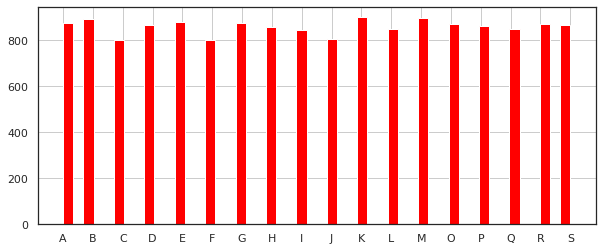

In [0]:
y_train.sort_values().hist(bins=50, color = 'red', figsize = (10, 4))

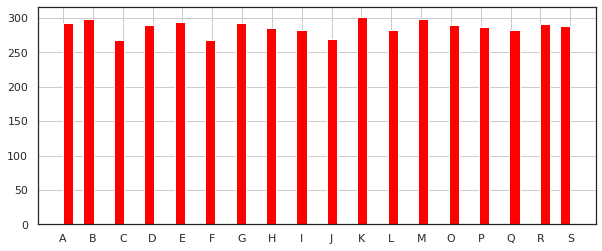

In [0]:
y_test.sort_values().hist(bins=50, color = 'red', figsize = (10, 4))

**Observation: both test and train series seem adequately balanced, pertaining the Activity labels representation**

Feature Selection:

**Remark:** In this particular case it has been proved that all the features so far (85) are of some positive importance to some extent and removing any of them will reduce the model scoring. so the respective cells will not be executed.

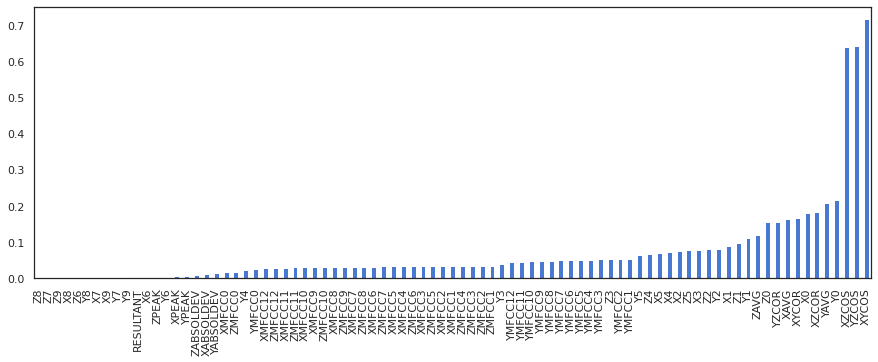

In [0]:
X_train.var().sort_values().plot(kind='bar', figsize=(15,5))

Aplying Variance Threshold selector - Drop features whose variance is below 0.05

In [0]:
#from sklearn.feature_selection import VarianceThreshold
#selector = VarianceThreshold(0.05)
#selector.fit(X_train)

In [0]:
#reduced_columns = X_train.columns[selector.get_support()]
#reduced_X_train = X_train[reduced_columns]
#reduced_X_train.head()

In [0]:
#len(reduced_columns)

In [0]:
#X_train = reduced_X_train
#X_train

Another method: Applying Select K Best selector (with k=30):

In [0]:
#feat_selector = SelectKBest(score_func=f_classif, k=30)

In [0]:
#X_train_reduced = \
#    pd.DataFrame(feat_selector.fit_transform(X_train, y_train), 
#                 columns=X_train.columns[feat_selector.get_support()].values)
#X_train_reduced.head()

# **Decision Tree Classification Model:**

In [0]:
def visualize_tree(model, md=5, width=800):
    dot_data = StringIO()  
    export_graphviz(model, out_file=dot_data, feature_names=X_train.columns, max_depth=md)
    graph = pydot.graph_from_dot_data(dot_data.getvalue())[0]  
    return Image(graph.create_png(), width=width) 

In [0]:
def print_dot_text(model, md=5):
    """The output of this function can be copied to http://www.webgraphviz.com/"""
    dot_data = StringIO()
    export_graphviz(model, out_file=dot_data, feature_names=X_train.columns, max_depth=md)
    dot_text = dot_data.getvalue()
    print(dot_text)

Cross Validator for the Grid Search:  StratifiedShuffleSplit

In [0]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GroupKFold

my_cv = StratifiedShuffleSplit(n_splits=5, train_size=0.7, test_size=0.3)

In [0]:
#for x in my_cv.split(X_train, y_train):
#    print(x)

In [0]:
dt_classifier = DecisionTreeClassifier()
#dt_classifier = DecisionTreeClassifier(min_samples_leaf = 15, min_impurity_decrease = 0.01)
#dt_classifier = DecisionTreeClassifier().fit(X_train, y_train)

In [0]:
my_param_grid = {'min_samples_leaf': [6, 10, 20, 40],
                 'min_weight_fraction_leaf': [0.01, 0.02, 0.05],
                 'criterion': ['gini', 'entropy'], 
                 'min_impurity_decrease': [1e-2, 7e-3]}                 
#                 'min_impurity_decrease': [1e-3, 1e-4, 1e-5]}

In [0]:
dt_model_gs = GridSearchCV(estimator=dt_classifier, 
                           param_grid=my_param_grid, 
                           cv=my_cv, 
                           scoring='accuracy',
                           verbose = 5,
                           return_train_score = True)
#                           scoring='neg_log_loss')

In [0]:
dt_model_gs.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01, score=(train=0.206, test=0.199), total=   0.3s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01, score=(train=0.206, test=0.209), total=   0.3s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.7s remaining:    0.0s


[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01, score=(train=0.222, test=0.213), total=   0.4s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.1s remaining:    0.0s


[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01, score=(train=0.191, test=0.189), total=   0.3s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01 


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.5s remaining:    0.0s


[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.01, score=(train=0.206, test=0.201), total=   0.3s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.02 
[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.02, score=(train=0.206, test=0.199), total=   0.3s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.02 
[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.02, score=(train=0.206, test=0.209), total=   0.3s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.02 
[CV]  criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.02, score=(train=0.222, test=0.213), total=   0.4s
[CV] criterion=gini, min_impurity_decrease=0.01, min_samples_leaf=6, min_weight_fraction_leaf=0.02 
[CV]  cr

[Parallel(n_jobs=1)]: Done 240 out of 240 | elapsed:  5.2min finished


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             i

In [0]:
dt_model_gs.best_params_

{'criterion': 'entropy',
 'min_impurity_decrease': 0.007,
 'min_samples_leaf': 6,
 'min_weight_fraction_leaf': 0.01}

In [0]:
dt_best_classifier = dt_model_gs.best_estimator_



In [0]:
dt_model_gs.cv_results_

{'mean_fit_time': array([0.3467855 , 0.34217863, 0.32578154, 0.34582057, 0.34241452,
        0.32635164, 0.34663467, 0.34210157, 0.326545  , 0.34516425,
        0.34148016, 0.32664261, 0.38973055, 0.38157921, 0.36412835,
        0.38840899, 0.38268948, 0.36412773, 0.3838861 , 0.37922149,
        0.36276927, 0.38525825, 0.37967067, 0.36206212, 2.70836768,
        2.27454271, 1.53187118, 2.71206508, 2.27535124, 1.53482714,
        2.7096498 , 2.27295713, 1.53235879, 2.70579062, 2.26764398,
        1.5292655 , 2.8249896 , 2.29783716, 1.53173079, 2.82284575,
        2.29683471, 1.53101268, 2.82352848, 2.29701233, 1.53534617,
        2.81752248, 2.29349031, 1.53086715]),
 'mean_score_time': array([0.00648618, 0.00667973, 0.00643225, 0.00651469, 0.00643239,
        0.00642209, 0.00646257, 0.00645833, 0.00647049, 0.0065352 ,
        0.00648656, 0.0066143 , 0.00656486, 0.00649371, 0.006499  ,
        0.00677338, 0.00656834, 0.00654936, 0.00650711, 0.00669198,
        0.00653415, 0.00649271, 0.

Enquire the constracted optimal model:

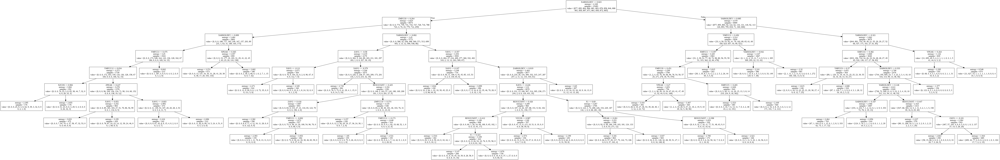

In [0]:
visualize_tree(dt_best_classifier, md=20, width=2000)

In [0]:
#print_dot_text(dt_best_classifier, md = 20 )

In [0]:
dt_best_classifier.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.007,
 'min_impurity_split': None,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.01,
 'presort': 'deprecated',
 'random_state': None,
 'splitter': 'best'}

In [0]:
dt_best_classifier.get_depth()

9

In [0]:
dt_best_classifier.get_n_leaves()

47

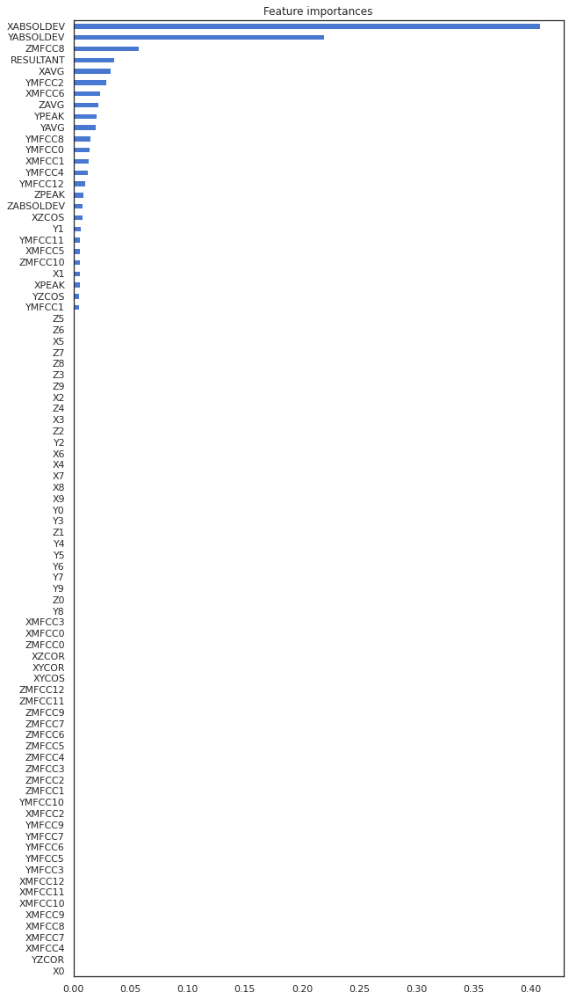

In [0]:
pd.Series(dt_best_classifier.feature_importances_, index=X_train.columns).sort_values(ascending = True)\
    .plot.barh(figsize=(10, 20), rot=0, title='Feature importances')

In [0]:
y_train

3356     H
8994     C
613      M
18582    M
3096     B
        ..
5788     J
20375    G
17754    J
18364    A
11861    K
Name: ACTIVITY, Length: 15483, dtype: object

In [0]:
y_train_pred = dt_best_classifier.predict(X_train)
print(pd.DataFrame(y_train_pred))

       0
0      G
1      A
2      A
3      M
4      B
...   ..
15478  D
15479  G
15480  K
15481  C
15482  R

[15483 rows x 1 columns]


In [0]:
cm = confusion_matrix(y_true=y_train,
                      y_pred=y_train_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=dt_best_classifier.classes_,
                      columns=dt_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.607754,0.019384,0.256556,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.002281,0.000000,0.078677,0.000000,0.034208,0.000000,0.000000,0.001140
jogging,0.050279,0.913966,0.030168,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.002235,0.000000,0.001117,0.000000,0.000000,0.002235
stairs,0.182836,0.032338,0.518657,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.217662,0.000000,0.043532,0.000000,0.000000,0.004975
sitting,0.003464,0.008083,0.021940,0.284065,0.114319,0.013857,0.109700,0.062356,0.024249,0.0,0.123557,0.035797,0.008083,0.001155,0.011547,0.061201,0.069284,0.047344
standing,0.001135,0.005675,0.006810,0.029512,0.660613,0.002270,0.154370,0.001135,0.000000,0.0,0.031782,0.000000,0.002270,0.014756,0.019296,0.002270,0.000000,0.068104
typing,0.001245,0.002491,0.004981,0.107098,0.210461,0.048568,0.059776,0.007472,0.016189,0.0,0.087173,0.012453,0.014944,0.000000,0.004981,0.323786,0.066002,0.032379
brushing teeth,0.004556,0.001139,0.018223,0.027335,0.089977,0.033030,0.515945,0.000000,0.007973,0.0,0.064920,0.051253,0.020501,0.001139,0.013667,0.015945,0.066059,0.068337
eating soup,0.000000,0.001166,0.003497,0.059441,0.102564,0.022145,0.096737,0.228438,0.052448,0.0,0.127040,0.011655,0.004662,0.000000,0.019814,0.039627,0.136364,0.094406
eating chips,0.000000,0.001182,0.007092,0.086288,0.133570,0.031915,0.112293,0.044917,0.141844,0.0,0.102837,0.046099,0.008274,0.003546,0.007092,0.053191,0.132388,0.087470
eating pasta,0.002475,0.000000,0.003713,0.073020,0.167079,0.044554,0.089109,0.080446,0.049505,0.0,0.158416,0.009901,0.009901,0.003713,0.009901,0.061881,0.176980,0.059406


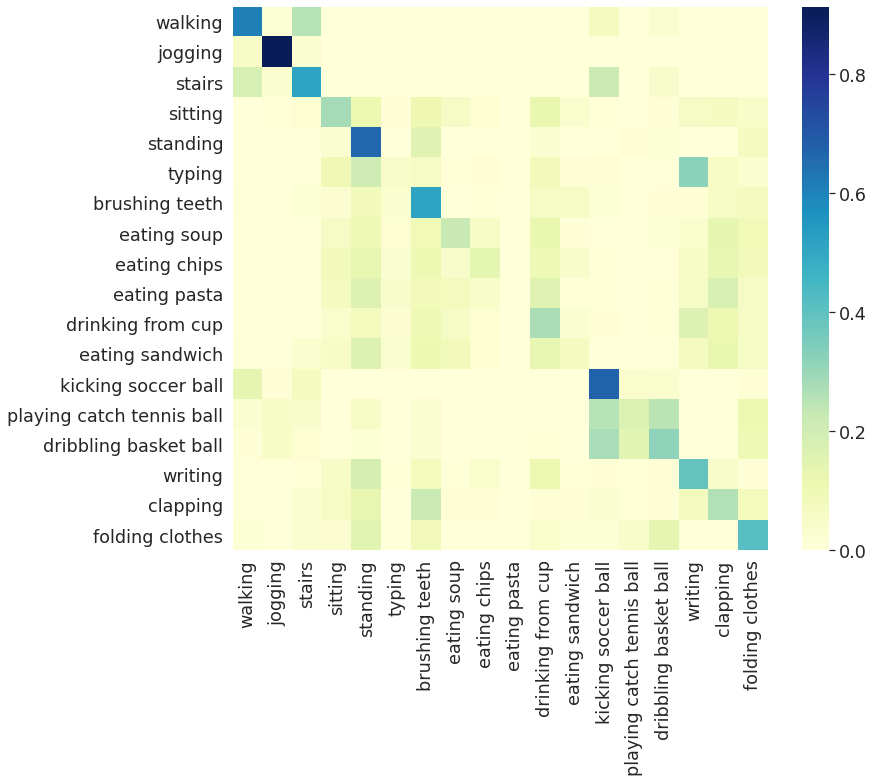

In [0]:
sns.set(font_scale=1.6)   
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2) 

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.607754
jogging,0.913966
stairs,0.518657
sitting,0.284065
standing,0.660613
typing,0.048568
brushing teeth,0.515945
eating soup,0.228438
eating chips,0.141844
eating pasta,0.000000


In [0]:
print(classification_report(y_true=y_train,
                            y_pred=y_train_pred))

              precision    recall  f1-score   support

           A       0.57      0.61      0.59       877
           B       0.82      0.91      0.87       895
           C       0.44      0.52      0.48       804
           D       0.32      0.28      0.30       866
           E       0.30      0.66      0.41       881
           F       0.17      0.05      0.08       803
           G       0.29      0.52      0.37       878
           H       0.38      0.23      0.29       858
           I       0.37      0.14      0.20       846
           J       0.00      0.00      0.00       808
           K       0.22      0.27      0.25       901
           L       0.22      0.07      0.10       850
           M       0.42      0.67      0.52       897
           O       0.39      0.17      0.24       871
           P       0.33      0.32      0.33       861
           Q       0.31      0.39      0.34       850
           R       0.22      0.26      0.24       872
           S       0.31    

In [0]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.36536846864302785

In [0]:
log_loss(y_train, dt_best_classifier.predict_proba(X_train))

1.799638886308448

Applying the best dt model on the test set:

In [0]:
y_test

5122     D
14758    D
236      O
20600    R
7743     B
        ..
16461    K
5021     B
3564     L
5191     E
5233     H
Name: ACTIVITY, Length: 5161, dtype: object

In [0]:
y_test_pred = dt_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     H
1     G
2     O
3     G
4     B
...  ..
5156  K
5157  B
5158  E
5159  E
5160  D

[5161 rows x 1 columns]


In [0]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=dt_best_classifier.classes_,
                      columns=dt_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.558219,0.017123,0.301370,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.003425,0.000000,0.092466,0.000000,0.027397,0.000000,0.000000,0.000000
jogging,0.040268,0.929530,0.026846,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003356
stairs,0.175373,0.033582,0.514925,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.212687,0.000000,0.063433,0.000000,0.000000,0.000000
sitting,0.003460,0.006920,0.024221,0.273356,0.110727,0.017301,0.062284,0.072664,0.020761,0.0,0.159170,0.051903,0.017301,0.000000,0.000000,0.069204,0.065744,0.044983
standing,0.000000,0.006803,0.017007,0.023810,0.632653,0.003401,0.187075,0.000000,0.000000,0.0,0.013605,0.000000,0.003401,0.003401,0.040816,0.017007,0.000000,0.051020
typing,0.000000,0.003731,0.000000,0.119403,0.201493,0.037313,0.052239,0.014925,0.022388,0.0,0.097015,0.037313,0.018657,0.000000,0.018657,0.272388,0.082090,0.022388
brushing teeth,0.010239,0.000000,0.010239,0.037543,0.085324,0.054608,0.467577,0.003413,0.006826,0.0,0.058020,0.044369,0.013652,0.003413,0.020478,0.034130,0.075085,0.075085
eating soup,0.000000,0.000000,0.003497,0.038462,0.087413,0.006993,0.087413,0.209790,0.062937,0.0,0.185315,0.010490,0.013986,0.003497,0.010490,0.048951,0.146853,0.083916
eating chips,0.003546,0.000000,0.017730,0.092199,0.148936,0.021277,0.106383,0.042553,0.148936,0.0,0.134752,0.028369,0.003546,0.000000,0.003546,0.067376,0.124113,0.056738
eating pasta,0.000000,0.000000,0.003717,0.078067,0.144981,0.070632,0.130112,0.074349,0.029740,0.0,0.141264,0.026022,0.003717,0.003717,0.011152,0.070632,0.171004,0.040892


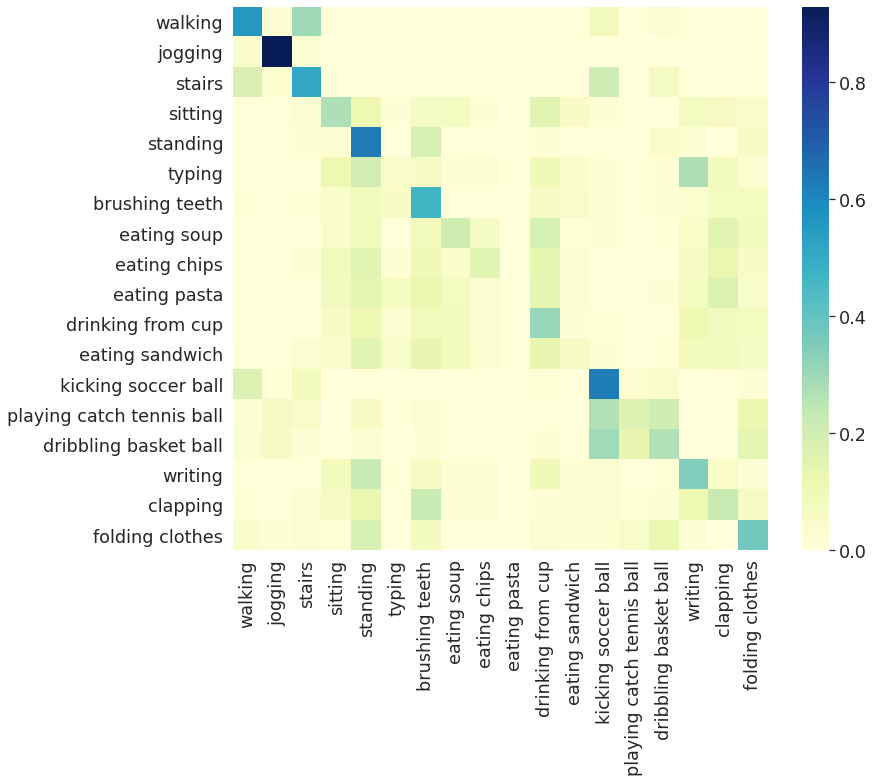

In [0]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2)

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.558219
jogging,0.929530
stairs,0.514925
sitting,0.273356
standing,0.632653
typing,0.037313
brushing teeth,0.467577
eating soup,0.209790
eating chips,0.148936
eating pasta,0.000000


In [0]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.53      0.56      0.54       292
           B       0.81      0.93      0.86       298
           C       0.42      0.51      0.46       268
           D       0.30      0.27      0.29       289
           E       0.28      0.63      0.39       294
           F       0.12      0.04      0.06       268
           G       0.27      0.47      0.35       293
           H       0.34      0.21      0.26       286
           I       0.39      0.15      0.22       282
           J       0.00      0.00      0.00       269
           K       0.23      0.31      0.26       301
           L       0.18      0.06      0.09       284
           M       0.38      0.62      0.48       299
           O       0.41      0.17      0.24       290
           P       0.30      0.27      0.28       287
           Q       0.27      0.35      0.31       283
           R       0.21      0.22      0.21       290
           S       0.30    

In [0]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.34547568300716913

In [0]:
log_loss(y_test, dt_best_classifier.predict_proba(X_test))

2.0119539429578506

In [0]:
scores = cross_val_score(dt_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.3543595263724435,
 0.3416576964477933,
 0.3433799784714747,
 0.33476856835306784,
 0.34660925726587727]

# **Random Forest Classification Model:**

In [0]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GroupKFold
from sklearn.ensemble import RandomForestClassifier

#my_cv = StratifiedShuffleSplit(n_splits=5, train_size=0.7, test_size=0.3)

In [0]:
#for x in my_cv.split(X_train, y_train):
#    print(x)

In [0]:
rf_classifier = RandomForestClassifier(**dt_model_gs.best_params_)
#rf_classifier = RandomForestClassifier(min_impurity_decrease=0.0005, min_weight_fraction_leaf=0.01, min_samples_leaf=3)

In [0]:
my_param_grid = {'bootstrap': [True, False], 
                 'n_estimators': [50, 100, 200], 
                 'oob_score': [True, False], 
                 'warm_start': [True, False]}

In [0]:
rf_model_gs = GridSearchCV(estimator=rf_classifier, 
                           param_grid=my_param_grid, 
                           scoring='accuracy',
#                           scoring='neg_log_loss', 
                           cv=my_cv)

In [0]:
#from time import time
#t1 = time()
rf_model_gs.fit(X_train, y_train)
#t2 = time()
#print(f"It took {t2-t1:.2f} seconds")

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='entropy',
                                              max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.007,
                                              min_impurity_split=None,
                                              min_samples_...
                                              min_weight_fraction_leaf=0.01,
                                              n_estimators=100, n_jobs=None,
                         

In [0]:
rf_best_classifier = rf_model_gs.best_estimator_

In [0]:
rf_model_gs.cv_results_

{'mean_fit_time': array([9.71721435e+00, 9.68316197e+00, 9.56886263e+00, 9.63567109e+00,
        1.93677566e+01, 1.94945913e+01, 1.90429231e+01, 1.92683094e+01,
        3.85336907e+01, 3.87374218e+01, 3.83630127e+01, 3.83005153e+01,
        1.85013294e-02, 1.73556805e-02, 1.49400918e+01, 1.50618690e+01,
        1.79950714e-02, 1.73477650e-02, 2.99163500e+01, 2.97925320e+01,
        1.80853367e-02, 1.78015709e-02, 5.95595564e+01, 5.97119302e+01]),
 'mean_score_time': array([0.0479085 , 0.04811459, 0.04893136, 0.04898295, 0.08859134,
        0.08936052, 0.09008732, 0.08915682, 0.17011638, 0.1723877 ,
        0.1715672 , 0.17134304, 0.        , 0.        , 0.04728994,
        0.04718161, 0.        , 0.        , 0.08923349, 0.08836203,
        0.        , 0.        , 0.16670098, 0.16594186]),
 'mean_test_score': array([0.45903122, 0.46079656, 0.45911733, 0.45756728, 0.46027987,
        0.4577395 , 0.4592465 , 0.45967707, 0.46114101, 0.4644564 ,
        0.46669537, 0.46208827,        nan,  

In [0]:
rf_best_classifier.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.007,
 'min_impurity_split': None,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.01,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': True}

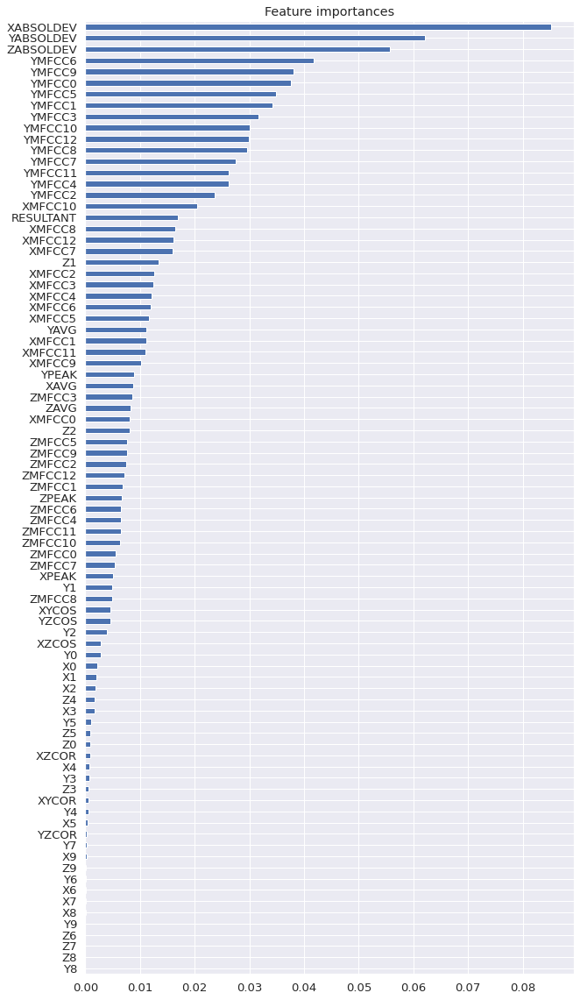

In [0]:
pd.Series(rf_best_classifier.feature_importances_, index=X_train.columns).sort_values(ascending = True)\
    .plot.barh(figsize=(10, 20), rot=0, title='Feature importances')

In [0]:
y_train

3356     H
8994     C
613      M
18582    M
3096     B
        ..
5788     J
20375    G
17754    J
18364    A
11861    K
Name: ACTIVITY, Length: 15483, dtype: object

In [0]:
y_train_pred = rf_best_classifier.predict(X_train)
print(pd.DataFrame(y_train_pred))

       0
0      G
1      A
2      M
3      M
4      B
...   ..
15478  L
15479  E
15480  K
15481  C
15482  R

[15483 rows x 1 columns]


In [0]:
cm = confusion_matrix(y_true=y_train,
                      y_pred=y_train_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=rf_best_classifier.classes_,
                      columns=rf_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.641961,0.066135,0.229190,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.051311,0.000000,0.006842,0.000000,0.000000,0.004561
jogging,0.059218,0.926257,0.007821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003352,0.000000,0.001117,0.000000,0.001117,0.001117
stairs,0.286070,0.069652,0.534826,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.084577,0.003731,0.016169,0.000000,0.000000,0.004975
sitting,0.015012,0.004619,0.016166,0.405312,0.073903,0.034642,0.041570,0.010393,0.042725,0.003464,0.146651,0.003464,0.008083,0.001155,0.006928,0.078522,0.065820,0.041570
standing,0.004540,0.000000,0.002270,0.000000,0.777526,0.002270,0.011351,0.000000,0.023837,0.004540,0.003405,0.000000,0.007946,0.027242,0.005675,0.002270,0.000000,0.127128
typing,0.002491,0.000000,0.002491,0.024907,0.154421,0.378580,0.003736,0.011208,0.074720,0.004981,0.100872,0.004981,0.016189,0.009963,0.000000,0.099626,0.059776,0.051059
brushing teeth,0.002278,0.000000,0.005695,0.012528,0.193622,0.007973,0.353075,0.013667,0.028474,0.021640,0.060364,0.000000,0.046697,0.009112,0.007973,0.039863,0.100228,0.096811
eating soup,0.004662,0.000000,0.000000,0.101399,0.088578,0.030303,0.054779,0.264569,0.072261,0.016317,0.128205,0.015152,0.004662,0.006993,0.006993,0.022145,0.068765,0.114219
eating chips,0.001182,0.001182,0.000000,0.028369,0.120567,0.031915,0.053191,0.016548,0.329787,0.050827,0.079196,0.005910,0.018913,0.004728,0.003546,0.072104,0.093381,0.088652
eating pasta,0.000000,0.000000,0.001238,0.085396,0.103960,0.021040,0.011139,0.035891,0.040842,0.278465,0.141089,0.028465,0.009901,0.012376,0.004950,0.051980,0.089109,0.084158


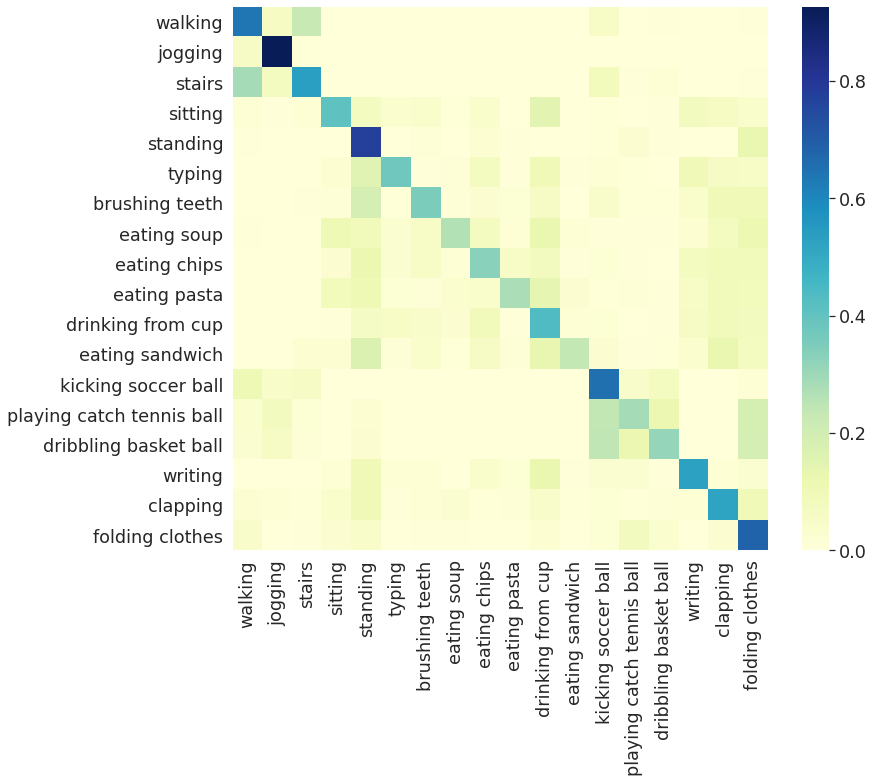

In [0]:
sns.set(font_scale=1.6)   
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2) 

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.641961
jogging,0.926257
stairs,0.534826
sitting,0.405312
standing,0.777526
typing,0.378580
brushing teeth,0.353075
eating soup,0.264569
eating chips,0.329787
eating pasta,0.278465


In [0]:
print(classification_report(y_true=y_train,
                            y_pred=y_train_pred))

              precision    recall  f1-score   support

           A       0.52      0.64      0.57       877
           B       0.74      0.93      0.82       895
           C       0.55      0.53      0.54       804
           D       0.54      0.41      0.46       866
           E       0.39      0.78      0.52       881
           F       0.62      0.38      0.47       803
           G       0.55      0.35      0.43       878
           H       0.62      0.26      0.37       858
           I       0.40      0.33      0.36       846
           J       0.62      0.28      0.38       808
           K       0.32      0.44      0.37       901
           L       0.72      0.24      0.35       850
           M       0.44      0.65      0.53       897
           O       0.44      0.29      0.35       871
           P       0.49      0.31      0.38       861
           Q       0.53      0.53      0.53       850
           R       0.42      0.52      0.46       872
           S       0.35    

In [0]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.47787896402505975

In [0]:
log_loss(y_train, dt_best_classifier.predict_proba(X_train))

1.799638886308448

Applying the best rf model on the test set:

In [0]:
y_test

5122     D
14758    D
236      O
20600    R
7743     B
        ..
16461    K
5021     B
3564     L
5191     E
5233     H
Name: ACTIVITY, Length: 5161, dtype: object

In [0]:
y_test_pred = rf_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     D
1     G
2     O
3     R
4     B
...  ..
5156  L
5157  B
5158  E
5159  E
5160  H

[5161 rows x 1 columns]


In [0]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=rf_best_classifier.classes_,
                      columns=rf_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.599315,0.044521,0.253425,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.092466,0.000000,0.010274,0.000000,0.000000,0.000000
jogging,0.046980,0.942953,0.006711,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003356
stairs,0.313433,0.063433,0.511194,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.089552,0.000000,0.022388,0.000000,0.000000,0.000000
sitting,0.010381,0.000000,0.027682,0.346021,0.083045,0.038062,0.031142,0.013841,0.031142,0.013841,0.211073,0.000000,0.013841,0.000000,0.000000,0.072664,0.065744,0.041522
standing,0.003401,0.000000,0.000000,0.003401,0.748299,0.003401,0.006803,0.000000,0.023810,0.000000,0.003401,0.000000,0.020408,0.030612,0.006803,0.003401,0.003401,0.142857
typing,0.000000,0.000000,0.000000,0.044776,0.141791,0.324627,0.007463,0.014925,0.082090,0.007463,0.115672,0.003731,0.011194,0.018657,0.003731,0.104478,0.059701,0.059701
brushing teeth,0.003413,0.000000,0.006826,0.034130,0.201365,0.010239,0.341297,0.020478,0.020478,0.037543,0.071672,0.000000,0.034130,0.003413,0.006826,0.034130,0.102389,0.071672
eating soup,0.000000,0.000000,0.000000,0.083916,0.076923,0.031469,0.062937,0.185315,0.069930,0.027972,0.185315,0.017483,0.017483,0.013986,0.003497,0.017483,0.080420,0.125874
eating chips,0.003546,0.000000,0.003546,0.014184,0.138298,0.028369,0.042553,0.024823,0.329787,0.056738,0.109929,0.007092,0.021277,0.000000,0.003546,0.056738,0.085106,0.074468
eating pasta,0.000000,0.000000,0.000000,0.100372,0.096654,0.014870,0.007435,0.018587,0.040892,0.319703,0.122677,0.011152,0.007435,0.000000,0.007435,0.055762,0.118959,0.078067


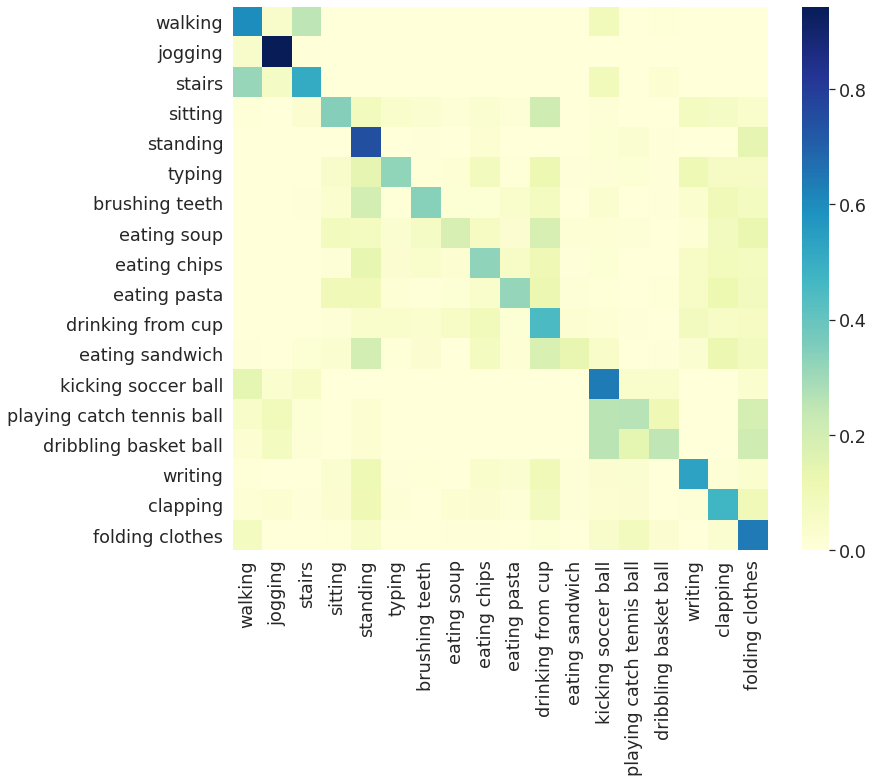

In [0]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2)

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.599315
jogging,0.942953
stairs,0.511194
sitting,0.346021
standing,0.748299
typing,0.324627
brushing teeth,0.341297
eating soup,0.185315
eating chips,0.329787
eating pasta,0.319703


In [0]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.47      0.60      0.52       292
           B       0.75      0.94      0.83       298
           C       0.53      0.51      0.52       268
           D       0.47      0.35      0.40       289
           E       0.37      0.75      0.50       294
           F       0.60      0.32      0.42       268
           G       0.59      0.34      0.43       293
           H       0.50      0.19      0.27       286
           I       0.39      0.33      0.36       282
           J       0.57      0.32      0.41       269
           K       0.29      0.45      0.35       301
           L       0.59      0.13      0.22       284
           M       0.40      0.64      0.50       299
           O       0.39      0.26      0.31       290
           P       0.50      0.25      0.33       287
           Q       0.53      0.54      0.54       283
           R       0.39      0.47      0.43       290
           S       0.33    

In [0]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.44913776399922495

In [0]:
log_loss(y_test, dt_best_classifier.predict_proba(X_test))

2.0119539429578506



---

# **Logistic Regression Model:**

---



In [0]:
from sklearn.linear_model import LogisticRegression
from mpl_toolkits.mplot3d import Axes3D
import warnings

warnings.filterwarnings('ignore')
#%matplotlib inline

In [0]:
lr_classifier = LogisticRegression(verbose = True)

In [0]:
my_param_grid = {'C': [0.1, 0.5, 1, 2, 5, 10, 50, 100]}

In [0]:
lr_model_gs = GridSearchCV(estimator=lr_classifier, 
                           param_grid=my_param_grid, 
                           cv=my_cv, 
                           scoring = 'accuracy')
#                           scoring='neg_log_loss')

In [0]:
lr_model_gs.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.7),
             error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=True,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 0.5, 1, 2, 5, 10, 50, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [0]:
lr_best_classifier = lr_model_gs.best_estimator_

In [0]:
lr_model_gs.cv_results_

{'mean_fit_time': array([2.26277833, 2.25340252, 2.31672888, 2.24773607, 2.261484  ,
        2.24553165, 2.23529296, 2.24209108]),
 'mean_score_time': array([0.01174417, 0.01132603, 0.01127701, 0.01132627, 0.01126809,
        0.01124706, 0.01150146, 0.01135697]),
 'mean_test_score': array([0.32525296, 0.35892357, 0.36628633, 0.37089343, 0.37171152,
        0.37308934, 0.37175457, 0.37158235]),
 'param_C': masked_array(data=[0.1, 0.5, 1, 2, 5, 10, 50, 100],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 0.1},
  {'C': 0.5},
  {'C': 1},
  {'C': 2},
  {'C': 5},
  {'C': 10},
  {'C': 50},
  {'C': 100}],
 'rank_test_score': array([8, 7, 6, 5, 3, 1, 2, 4], dtype=int32),
 'split0_test_score': array([0.31948332, 0.35780409, 0.37093649, 0.3722282 , 0.37502691,
        0.37610334, 0.37631862, 0.37029064]),
 'split1_test_score': array([0.32034446, 0.35565124, 0.36663079, 0.37244349, 0.37395048,
     

In [0]:
lr_best_classifier.get_params()

{'C': 10,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': True,
 'warm_start': False}

In [0]:
y_train

3356     H
8994     C
613      M
18582    M
3096     B
        ..
5788     J
20375    G
17754    J
18364    A
11861    K
Name: ACTIVITY, Length: 15483, dtype: object

In [0]:
y_train_pred=lr_best_classifier.predict(X_train)
print(pd.DataFrame(y_train_pred))

In [0]:
cm = confusion_matrix(y_true=y_train,
                      y_pred=y_train_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=lr_best_classifier.classes_,
                      columns=lr_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.686431,0.021665,0.200684,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001140,0.000000,0.055872,0.005701,0.013683,0.000000,0.011403,0.003421
jogging,0.037989,0.920670,0.029050,0.002235,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001117,0.001117,0.005587,0.000000,0.001117,0.001117
stairs,0.124378,0.028607,0.656716,0.000000,0.000000,0.000000,0.002488,0.000000,0.000000,0.000000,0.000000,0.000000,0.084577,0.023632,0.060945,0.000000,0.012438,0.006219
sitting,0.006928,0.005774,0.010393,0.333718,0.060046,0.019630,0.062356,0.040416,0.057737,0.036952,0.076212,0.091224,0.003464,0.006928,0.006928,0.080831,0.064665,0.035797
standing,0.004540,0.001135,0.001135,0.014756,0.694665,0.024972,0.039728,0.003405,0.026107,0.011351,0.001135,0.004540,0.005675,0.022701,0.040863,0.017026,0.014756,0.071510
typing,0.001245,0.002491,0.001245,0.033624,0.139477,0.166874,0.066002,0.046077,0.145704,0.022416,0.185554,0.031133,0.003736,0.013699,0.001245,0.103362,0.026152,0.009963
brushing teeth,0.001139,0.001139,0.011390,0.066059,0.075171,0.026196,0.332574,0.046697,0.014806,0.033030,0.059226,0.045558,0.003417,0.020501,0.019362,0.062642,0.074032,0.107062
eating soup,0.002331,0.000000,0.001166,0.134033,0.100233,0.037296,0.088578,0.196970,0.104895,0.036131,0.081585,0.030303,0.001166,0.002331,0.001166,0.046620,0.085082,0.050117
eating chips,0.000000,0.001182,0.001182,0.061466,0.079196,0.087470,0.082742,0.054374,0.271868,0.056738,0.102837,0.056738,0.002364,0.004728,0.000000,0.034279,0.078014,0.024823
eating pasta,0.000000,0.000000,0.001238,0.051980,0.077970,0.111386,0.061881,0.111386,0.069307,0.047030,0.163366,0.105198,0.001238,0.012376,0.001238,0.084158,0.060644,0.039604


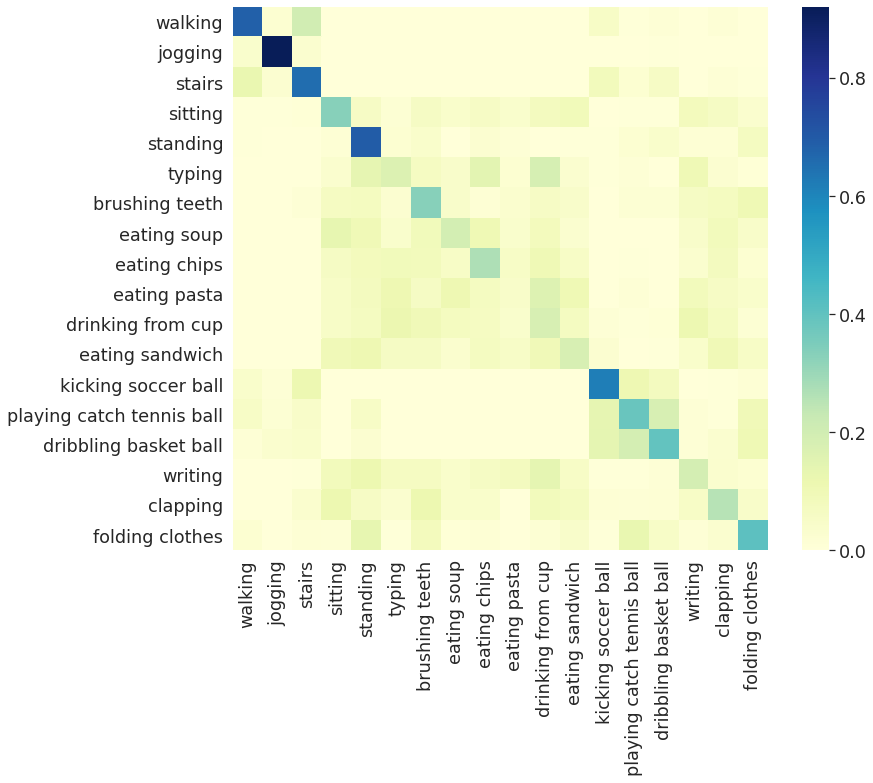

In [0]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2)

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.686431
jogging,0.920670
stairs,0.656716
sitting,0.333718
standing,0.694665
typing,0.166874
brushing teeth,0.332574
eating soup,0.196970
eating chips,0.271868
eating pasta,0.047030


In [0]:
print(classification_report(y_true=y_train,
                            y_pred=y_train_pred))

              precision    recall  f1-score   support

           A       0.69      0.69      0.69       877
           B       0.88      0.92      0.90       895
           C       0.53      0.66      0.59       804
           D       0.32      0.33      0.32       866
           E       0.39      0.69      0.50       881
           F       0.21      0.17      0.18       803
           G       0.29      0.33      0.31       878
           H       0.29      0.20      0.23       858
           I       0.29      0.27      0.28       846
           J       0.11      0.05      0.07       808
           K       0.16      0.18      0.17       901
           L       0.23      0.18      0.20       850
           M       0.56      0.62      0.59       897
           O       0.41      0.39      0.40       871
           P       0.44      0.40      0.42       861
           Q       0.22      0.19      0.21       850
           R       0.27      0.26      0.27       872
           S       0.36    

In [0]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.38829684169734546

In [0]:
log_loss(y_train, lr_best_classifier.predict_proba(X_train))

1.8354373444323964

**Applying the best lr model on the test set:**

In [0]:
y_test

5122     D
14758    D
236      O
20600    R
7743     B
        ..
16461    K
5021     B
3564     L
5191     E
5233     H
Name: ACTIVITY, Length: 5161, dtype: object

In [0]:
y_test_pred = lr_best_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     L
1     G
2     P
3     K
4     B
...  ..
5156  L
5157  B
5158  D
5159  E
5160  D

[5161 rows x 1 columns]


In [0]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=lr_best_classifier.classes_,
                      columns=lr_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.702055,0.027397,0.154110,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.068493,0.023973,0.006849,0.000000,0.010274,0.006849
jogging,0.026846,0.926174,0.043624,0.003356,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
stairs,0.119403,0.026119,0.652985,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003731,0.067164,0.044776,0.070896,0.000000,0.007463,0.007463
sitting,0.006920,0.000000,0.020761,0.301038,0.048443,0.024221,0.048443,0.048443,0.072664,0.031142,0.107266,0.079585,0.003460,0.010381,0.000000,0.117647,0.069204,0.010381
standing,0.006803,0.003401,0.000000,0.013605,0.714286,0.023810,0.023810,0.010204,0.010204,0.010204,0.000000,0.013605,0.013605,0.010204,0.040816,0.020408,0.023810,0.061224
typing,0.000000,0.000000,0.000000,0.026119,0.156716,0.134328,0.055970,0.033582,0.190299,0.033582,0.160448,0.037313,0.003731,0.018657,0.007463,0.074627,0.055970,0.011194
brushing teeth,0.000000,0.000000,0.003413,0.071672,0.105802,0.034130,0.324232,0.034130,0.017065,0.030717,0.064846,0.037543,0.003413,0.020478,0.023891,0.068259,0.078498,0.081911
eating soup,0.003497,0.000000,0.000000,0.094406,0.101399,0.038462,0.083916,0.171329,0.101399,0.034965,0.150350,0.034965,0.000000,0.000000,0.000000,0.073427,0.083916,0.027972
eating chips,0.000000,0.000000,0.000000,0.049645,0.074468,0.078014,0.095745,0.053191,0.230496,0.060284,0.131206,0.074468,0.003546,0.003546,0.003546,0.042553,0.067376,0.031915
eating pasta,0.000000,0.000000,0.000000,0.059480,0.052045,0.156134,0.066914,0.078067,0.085502,0.066914,0.189591,0.118959,0.000000,0.007435,0.000000,0.055762,0.048327,0.014870


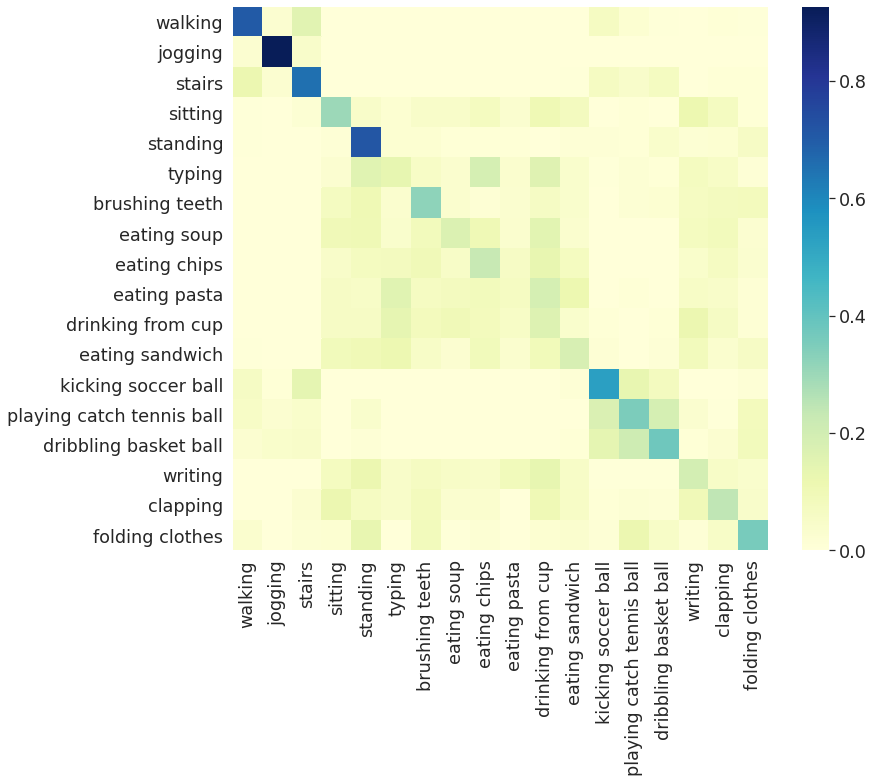

In [0]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2)

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.702055
jogging,0.926174
stairs,0.652985
sitting,0.301038
standing,0.714286
typing,0.134328
brushing teeth,0.324232
eating soup,0.171329
eating chips,0.230496
eating pasta,0.066914


In [0]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.67      0.70      0.69       292
           B       0.88      0.93      0.90       298
           C       0.54      0.65      0.59       268
           D       0.31      0.30      0.30       289
           E       0.41      0.71      0.52       294
           F       0.15      0.13      0.14       268
           G       0.31      0.32      0.32       293
           H       0.27      0.17      0.21       286
           I       0.24      0.23      0.23       282
           J       0.14      0.07      0.09       269
           K       0.13      0.17      0.15       301
           L       0.23      0.18      0.21       284
           M       0.51      0.54      0.52       299
           O       0.36      0.35      0.35       290
           P       0.42      0.38      0.40       287
           Q       0.19      0.20      0.20       283
           R       0.27      0.24      0.25       290
           S       0.38    

In [0]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.3718271652780469

In [0]:
log_loss(y_test, lr_best_classifier.predict_proba(X_test))

1.8928524686900055



---


**Cross Validation:**


---



In [0]:
k=5
scores = cross_val_score(lr_best_classifier, X_train, y_train, cv=k)
list(scores)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s finished


[0.3861801743622861,
 0.3710041976105909,
 0.36745237326444946,
 0.3601421188630491,
 0.3772609819121447]

In [0]:
scores = cross_val_score(lr_best_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s finished


[0.379978471474704,
 0.3713670613562971,
 0.3651237890204521,
 0.3806243272335845,
 0.3756727664155005]



---

# **K Nearest Neighbors Model:**

---



In [0]:
from sklearn.neighbors import KNeighborsClassifier

In [0]:
knn_classifier = KNeighborsClassifier(n_neighbors = 17)

In [0]:
knn_classifier.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=17, p=2,
                     weights='uniform')

In [0]:
#my_param_grid = {'n_neighbors': [20, 21, 22, 23, 24], 'leaf_size': [20, 30, 40]}

In [0]:
#knn_model_gs = GridSearchCV(estimator=knn_classifier, 
#                            param_grid=my_param_grid, 
#                            cv=my_cv, 
#                            scoring='accuracy')
#                            scoring='neg_log_loss')

In [0]:
#knn_model_gs.fit(X_train, y_train)

In [0]:
#knn_best_classifier = knn_model_gs.best_estimator_

In [0]:
#knn_model_gs.cv_results_

In [0]:
#knn_best_classifier.get_params()

In [0]:
y_train

11736    D
19120    G
4898     R
19325    Q
8148     R
        ..
8957     A
2184     P
17820    K
14580    P
10177    F
Name: ACTIVITY, Length: 15483, dtype: object

In [0]:
y_train_pred=knn_classifier.predict(X_train)
print(pd.DataFrame(y_train_pred))

       0
0      J
1      I
2      R
3      L
4      R
...   ..
15478  A
15479  P
15480  K
15481  P
15482  F

[15483 rows x 1 columns]


In [0]:
cm = confusion_matrix(y_true=y_train,
                      y_pred=y_train_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=knn_classifier.classes_,
                      columns=knn_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.956670,0.001140,0.023945,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009122,0.003421,0.003421,0.000000,0.000000,0.002281
jogging,0.024581,0.960894,0.005587,0.002235,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003352,0.002235,0.000000,0.000000,0.001117,0.000000
stairs,0.080846,0.034826,0.827114,0.001244,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.042289,0.004975,0.003731,0.000000,0.000000,0.004975
sitting,0.004619,0.003464,0.024249,0.688222,0.008083,0.038106,0.025404,0.028868,0.013857,0.018476,0.042725,0.012702,0.009238,0.012702,0.002309,0.031178,0.024249,0.011547
standing,0.002270,0.001135,0.003405,0.004540,0.783201,0.011351,0.009081,0.012486,0.009081,0.015891,0.002270,0.006810,0.013621,0.036322,0.026107,0.018161,0.012486,0.031782
typing,0.001245,0.000000,0.002491,0.014944,0.051059,0.735990,0.007472,0.026152,0.043587,0.018680,0.017435,0.011208,0.001245,0.002491,0.001245,0.036115,0.007472,0.021171
brushing teeth,0.000000,0.000000,0.004556,0.027335,0.009112,0.015945,0.739180,0.018223,0.028474,0.015945,0.009112,0.034169,0.002278,0.012528,0.010251,0.030752,0.030752,0.011390
eating soup,0.002331,0.001166,0.002331,0.036131,0.030303,0.041958,0.026807,0.650350,0.027972,0.036131,0.044289,0.030303,0.001166,0.010490,0.006993,0.024476,0.013986,0.012821
eating chips,0.000000,0.000000,0.004728,0.040189,0.031915,0.041371,0.030733,0.043735,0.572104,0.034279,0.066194,0.040189,0.001182,0.010638,0.007092,0.030733,0.030733,0.014184
eating pasta,0.002475,0.000000,0.002475,0.029703,0.023515,0.033416,0.022277,0.040842,0.040842,0.616337,0.044554,0.043317,0.001238,0.011139,0.007426,0.038366,0.024752,0.017327


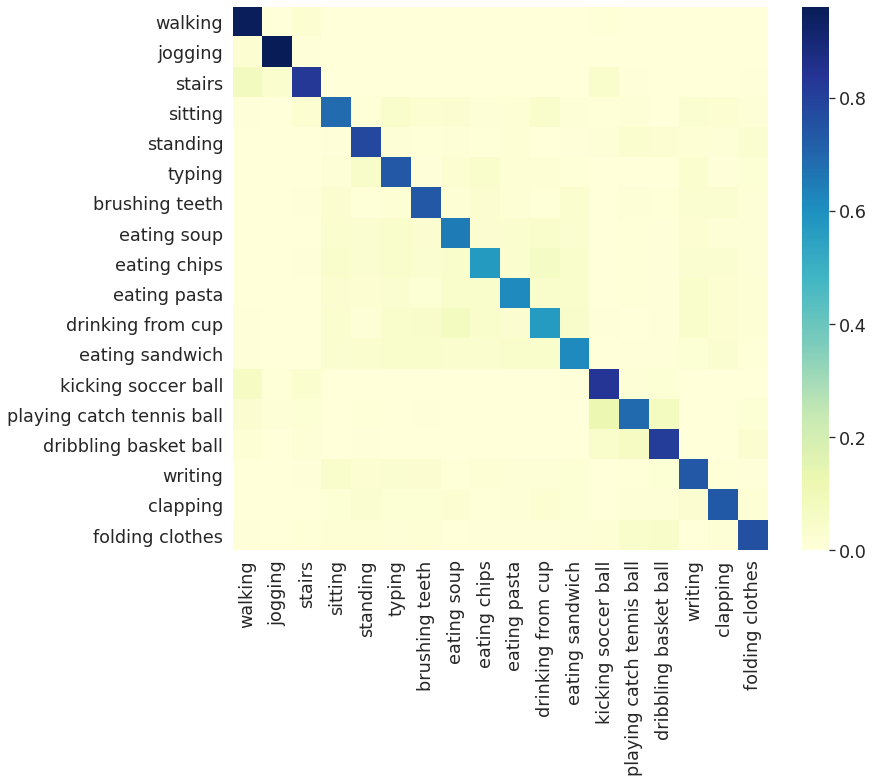

In [0]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2)

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values()) #correct also where the cm is not normalized
accuracy_per_activity

,0
walking,0.956670
jogging,0.960894
stairs,0.827114
sitting,0.688222
standing,0.783201
typing,0.735990
brushing teeth,0.739180
eating soup,0.650350
eating chips,0.572104
eating pasta,0.616337


In [0]:
print(classification_report(y_true=y_train,
                            y_pred=y_train_pred))

              precision    recall  f1-score   support

           A       0.79      0.96      0.87       877
           B       0.93      0.96      0.95       895
           C       0.82      0.83      0.82       804
           D       0.69      0.69      0.69       866
           E       0.74      0.78      0.76       881
           F       0.67      0.74      0.70       803
           G       0.73      0.74      0.73       878
           H       0.67      0.65      0.66       858
           I       0.68      0.57      0.62       846
           J       0.71      0.62      0.66       808
           K       0.66      0.57      0.61       901
           L       0.68      0.62      0.65       851
           M       0.75      0.83      0.79       897
           O       0.73      0.69      0.71       871
           P       0.76      0.81      0.78       861
           Q       0.70      0.74      0.72       850
           R       0.76      0.73      0.75       871
           S       0.77    

In [0]:
accuracy_score(y_true=y_train, y_pred=y_train_pred)

0.73900406897888

In [0]:
log_loss(y_train, knn_best_classifier.predict_proba(X_train))

0.706711417273854

**Applying the knn model on the test set:**

In [0]:
y_test

20286    E
12532    M
4527     I
17839    M
5349     K
        ..
4958     S
3468     J
16713    E
7159     Q
3024     S
Name: ACTIVITY, Length: 5161, dtype: object

In [0]:
y_test_pred = knn_classifier.predict(X_test)
print(pd.DataFrame(y_test_pred))

      0
0     G
1     M
2     I
3     S
4     K
...  ..
5156  S
5157  J
5158  J
5159  Q
5160  G

[5161 rows x 1 columns]


In [0]:
cm = confusion_matrix(y_true=y_test,
                      y_pred=y_test_pred, normalize = 'true')

cm_act = pd.DataFrame(cm,
                      index=knn_best_classifier.classes_,
                      columns=knn_best_classifier.classes_)

cm_act.columns = activity_codes_mapping.values()
cm_act.index = activity_codes_mapping.values()
cm_act

,walking,jogging,stairs,sitting,standing,typing,brushing teeth,eating soup,eating chips,eating pasta,drinking from cup,eating sandwich,kicking soccer ball,playing catch tennis ball,dribbling basket ball,writing,clapping,folding clothes
walking,0.965753,0.003425,0.013699,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003425,0.000000,0.006849,0.006849,0.000000,0.000000,0.000000,0.000000
jogging,0.030201,0.949664,0.006711,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006711,0.000000,0.006711,0.000000,0.000000,0.000000
stairs,0.074627,0.022388,0.835821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003731,0.048507,0.000000,0.007463,0.000000,0.000000,0.007463
sitting,0.006920,0.000000,0.003460,0.650519,0.024221,0.034602,0.031142,0.034602,0.013841,0.027682,0.044983,0.010381,0.003460,0.006920,0.010381,0.038062,0.031142,0.027682
standing,0.003401,0.000000,0.006803,0.010204,0.704082,0.003401,0.017007,0.040816,0.003401,0.030612,0.003401,0.027211,0.006803,0.040816,0.013605,0.013605,0.034014,0.040816
typing,0.000000,0.003731,0.000000,0.044776,0.033582,0.638060,0.011194,0.059701,0.048507,0.033582,0.029851,0.007463,0.007463,0.007463,0.003731,0.041045,0.014925,0.014925
brushing teeth,0.000000,0.000000,0.006826,0.047782,0.006826,0.037543,0.668942,0.010239,0.020478,0.010239,0.010239,0.051195,0.003413,0.010239,0.020478,0.047782,0.030717,0.017065
eating soup,0.000000,0.003497,0.000000,0.062937,0.010490,0.052448,0.010490,0.639860,0.027972,0.031469,0.059441,0.020979,0.003497,0.006993,0.003497,0.027972,0.017483,0.020979
eating chips,0.000000,0.000000,0.000000,0.035461,0.039007,0.060284,0.042553,0.046099,0.468085,0.063830,0.081560,0.035461,0.007092,0.010638,0.010638,0.035461,0.049645,0.014184
eating pasta,0.007435,0.000000,0.000000,0.040892,0.011152,0.052045,0.037175,0.089219,0.052045,0.553903,0.040892,0.018587,0.000000,0.014870,0.003717,0.048327,0.022305,0.007435


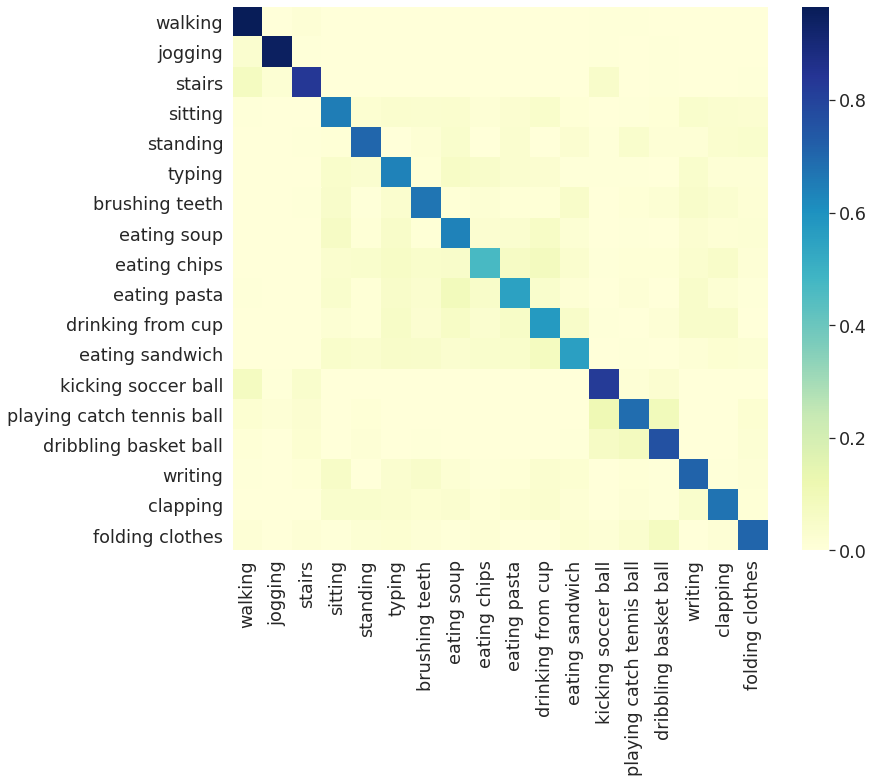

In [0]:
sns.set(font_scale=1.6)
fig, ax = plt.subplots(figsize=(12,10))
#sns.set(font_scale=1.6)   
sns.heatmap(cm_act, cmap="YlGnBu")
#sns.heatmap(cm_act, cmap="Greens")

In [0]:
sns.set(font_scale=1.2)

In [0]:
accuracy_per_activity = pd.DataFrame([cm_act.iloc[i][i]/np.sum(cm_act.iloc[i]) for i in range(18)],index=activity_codes_mapping.values())
accuracy_per_activity

,0
walking,0.965753
jogging,0.949664
stairs,0.835821
sitting,0.650519
standing,0.704082
typing,0.638060
brushing teeth,0.668942
eating soup,0.639860
eating chips,0.468085
eating pasta,0.553903


In [0]:
print(classification_report(y_true=y_test,
                            y_pred=y_test_pred))

              precision    recall  f1-score   support

           A       0.80      0.97      0.87       292
           B       0.95      0.95      0.95       298
           C       0.83      0.84      0.83       268
           D       0.62      0.65      0.64       289
           E       0.74      0.70      0.72       294
           F       0.58      0.64      0.61       268
           G       0.69      0.67      0.68       293
           H       0.60      0.64      0.62       286
           I       0.63      0.47      0.54       282
           J       0.61      0.55      0.58       269
           K       0.59      0.57      0.58       301
           L       0.64      0.56      0.60       283
           M       0.74      0.82      0.78       299
           O       0.72      0.69      0.71       290
           P       0.71      0.76      0.73       287
           Q       0.66      0.71      0.69       283
           R       0.70      0.67      0.68       291
           S       0.74    

In [0]:
accuracy_score(y_true=y_test, y_pred=y_test_pred)

0.699670606471614

In [0]:
log_loss(y_test, knn_best_classifier.predict_proba(X_test))

2.0846411034474115



---


**Cross Validation:**


---



In [0]:
k=5
scores = cross_val_score(knn_classifier, X_train, y_train, cv=k)
list(scores)

[0.6628995802389409,
 0.6635453664836939,
 0.6532127865676461,
 0.6637596899224806,
 0.6721576227390181]

In [0]:
scores = cross_val_score(knn_classifier, X_train, y_train, cv=my_cv, scoring='accuracy')
list(scores)

[0.6495156081808396,
 0.6484391819160388,
 0.6393972012917115,
 0.6393972012917115,
 0.6527448869752422]

# **Conclusions:**

---

1) The K Nearest Neighbor classifier has prooved to provide substantial higher prediction accuracy that the rest of the models (overall accuracy ~0.7 in test set) in this case.

2) The  analysis demonstrated typical differentiation of detection accuracy accross the various physical activities:

* The highest detection accuracy is for Jogging: **~0.95**
* walking, stairs, kicking soccer ball, dribbling basket ball also have high accuracies: ~0.8
* On the other hand, the eating related activities have lower detection 
accuracies: ~0.5 

However, this lower accuracy is still surprisingly significant ! (10 times the neutral guess accuracy, 1/18), considering the fact that the smartphone was placed inside the participant's pants leg pocket !!

3) The accuracy profiles are consistant with the visual clustering patterns seen in the three dimentional features visualization plots, in particular, the jogging points clusters where exceptionally noticable and distinct.

4) Probable explanations to the above observations:

* The Jogging etc. where highly predictable because they where the most **intence** and strongly related to **leg** movement (the phone was inside the leg pocket)

* The suprisingly significant accuracy rates of identifying eatings activites by the phone could may be explained by the posture sitting changes characterizing such activities:

* The fact that the accelerometer measures also the gravity vector, could supply additional implied information as to the orientation of the device and, therefore, as to the posture mode (standing/sitting) of the participant, which could contribute to the accuracy detection ability.

5) Remark: In this particular case, reduction of features number (from 85 to ~ 30, excluding the features whose variance was < 0.05), resulted in lower accuracy levels ! (by more than ~10%)